# Heart Failure Prediction and Classification using Machine Learning Techniques

In [244]:
# import 'Pandas' 
import pandas as pd 

# import 'Numpy' 
import numpy as np

# import subpackage of Matplotlib
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap

# import 'Seaborn' 
import seaborn as sns

# to suppress warnings
from warnings import filterwarnings
filterwarnings('ignore')

# display all columns of the dataframe
pd.options.display.max_columns = None

# display all rows of the dataframe
pd.options.display.max_rows = None
 
# to display the float values upto 6 decimal places     
pd.options.display.float_format = '{:.6f}'.format

# import train-test split 
from sklearn.model_selection import train_test_split

# import StandardScaler to perform scaling
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler

# import various functions from sklearn 
from sklearn.neighbors import KNeighborsClassifier
from sklearn import metrics
from sklearn.metrics import classification_report
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import cross_val_score
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn import tree
from sklearn.feature_selection import RFE

from mlxtend.feature_selection import SequentialFeatureSelector as sfs

# for performance metric
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score

# import the functions for visualizing the decision tree
import pydotplus
from IPython.display import Image

In [245]:
plt.rcParams['figure.figsize'] = [15,8]

In [246]:
df_heart = pd.read_csv("Social Media Data for DSBA (1).csv")
df_heart.shape

(11760, 17)

In [247]:
df_heart.columns

Index(['UserID', 'Taken_product', 'Yearly_avg_view_on_travel_page',
       'preferred_device', 'total_likes_on_outstation_checkin_given',
       'yearly_avg_Outstation_checkins', 'member_in_family',
       'preferred_location_type', 'Yearly_avg_comment_on_travel_page',
       'total_likes_on_outofstation_checkin_received',
       'week_since_last_outstation_checkin', 'following_company_page',
       'montly_avg_comment_on_company_page', 'working_flag',
       'travelling_network_rating', 'Adult_flag',
       'Daily_Avg_mins_spend_on_traveling_page'],
      dtype='object')

In [248]:
df_heart.drop(["UserID"],axis=1,inplace=True)

In [249]:
df_heart.head()

,Taken_product,Yearly_avg_view_on_travel_page,preferred_device,total_likes_on_outstation_checkin_given,yearly_avg_Outstation_checkins,member_in_family,preferred_location_type,Yearly_avg_comment_on_travel_page,total_likes_on_outofstation_checkin_received,week_since_last_outstation_checkin,following_company_page,montly_avg_comment_on_company_page,working_flag,travelling_network_rating,Adult_flag,Daily_Avg_mins_spend_on_traveling_page
0,Yes,307.000000,iOS and Android,38570.000000,1,2,Financial,94.000000,5993,8,Yes,11,No,1,0,8
1,No,367.000000,iOS,9765.000000,1,1,Financial,61.000000,5130,1,No,23,Yes,4,1,10
2,Yes,277.000000,iOS and Android,48055.000000,1,2,Other,92.000000,2090,6,Yes,15,No,2,0,7
3,No,247.000000,iOS,48720.000000,1,4,Financial,56.000000,2909,1,Yes,11,No,3,0,8
4,No,202.000000,iOS and Android,20685.000000,1,1,Medical,40.000000,3468,9,No,12,No,4,1,6


In [250]:
# Building model for only mobile device and dropping that column after filetring that
df_heart=df_heart[df_heart["preferred_device"]!="Laptop"]
df_heart["preferred_device"].unique()

array(['iOS and Android', 'iOS', 'ANDROID', nan, 'Android', 'Android OS',
       'Other', 'Others', 'Tab', 'Mobile'], dtype=object)

In [251]:
df_heart.dtypes

Taken_product                                    object
Yearly_avg_view_on_travel_page                  float64
preferred_device                                 object
total_likes_on_outstation_checkin_given         float64
yearly_avg_Outstation_checkins                   object
member_in_family                                 object
preferred_location_type                          object
Yearly_avg_comment_on_travel_page               float64
total_likes_on_outofstation_checkin_received      int64
week_since_last_outstation_checkin                int64
following_company_page                           object
montly_avg_comment_on_company_page                int64
working_flag                                     object
travelling_network_rating                         int64
Adult_flag                                        int64
Daily_Avg_mins_spend_on_traveling_page            int64
dtype: object

In [252]:
# there are by =default 5 object columns need to correct the datatype for all thise 5 object column
# 1. working flag
df_heart["working_flag"].unique()

array(['No', 'Yes'], dtype=object)

In [253]:
# there are by =default 5 object columns need to correct the datatype for all thise 5 object column
df_heart["following_company_page"].unique()

array(['Yes', 'No', nan, '1', '0'], dtype=object)

In [254]:
df_heart["following_company_page"].replace(to_replace="1",value="Yes",inplace=True)

In [255]:
df_heart["following_company_page"].replace(to_replace="0",value="No",inplace=True)

In [256]:
# there are by =default 5 object columns need to correct the datatype for all thise 5 object column
df_heart["following_company_page"].unique()

array(['Yes', 'No', nan], dtype=object)

In [257]:
#3.# there are by =default 5 object columns need to correct the datatype for all thise 5 object column
df_heart["member_in_family"].unique()

array(['2', '1', '4', 'Three', '3', '5', '10'], dtype=object)

In [258]:
df_heart["member_in_family"].replace(to_replace="Three",value="3",inplace=True)

In [259]:
#3.# there are by =default 5 object columns need to correct the datatype for all thise 5 object column
df_heart["member_in_family"].unique()

array(['2', '1', '4', '3', '5', '10'], dtype=object)

In [260]:
#4. there are by =default 5 object columns need to correct the datatype for all thise 5 object column
df_heart["preferred_location_type"].unique()

array(['Financial', 'Other', 'Medical', nan, 'Game', 'Social media',
       'Entertainment', 'Tour and Travel', 'Movie', 'OTT', 'Tour  Travel',
       'Beach', 'Historical site', 'Big Cities', 'Trekking',
       'Hill Stations'], dtype=object)

In [261]:
#3.# there are by =default 5 object columns need to correct the datatype for all thise 5 object column
df_heart["yearly_avg_Outstation_checkins"].unique()

array(['1', '24', '23', '27', '16', '15', '26', '19', '21', '11', '10',
       '25', '12', '18', '29', nan, '22', '14', '20', '28', '17', '13',
       '*', '5', '2', '3', '9', '7', '6', '8', '4'], dtype=object)

In [262]:
df_heart["yearly_avg_Outstation_checkins"].replace(to_replace="*",value=np.nan,inplace=True)

In [263]:
#3.# there are by =default 5 object columns need to correct the datatype for all thise 5 object column
df_heart["yearly_avg_Outstation_checkins"].unique()

array(['1', '24', '23', '27', '16', '15', '26', '19', '21', '11', '10',
       '25', '12', '18', '29', nan, '22', '14', '20', '28', '17', '13',
       '5', '2', '3', '9', '7', '6', '8', '4'], dtype=object)

In [264]:
df_heart["yearly_avg_Outstation_checkins"]=df_heart["yearly_avg_Outstation_checkins"].astype("float64")

In [265]:
df_heart["member_in_family"]=df_heart["member_in_family"].astype("float64")

In [266]:
df_heart_cat=df_heart.select_dtypes(include="object")
df_heart_cat.columns

Index(['Taken_product', 'preferred_device', 'preferred_location_type',
       'following_company_page', 'working_flag'],
      dtype='object')

In [268]:
df_heart.columns

Index(['Taken_product', 'Yearly_avg_view_on_travel_page', 'preferred_device',
       'total_likes_on_outstation_checkin_given',
       'yearly_avg_Outstation_checkins', 'member_in_family',
       'preferred_location_type', 'Yearly_avg_comment_on_travel_page',
       'total_likes_on_outofstation_checkin_received',
       'week_since_last_outstation_checkin', 'following_company_page',
       'montly_avg_comment_on_company_page', 'working_flag',
       'travelling_network_rating', 'Adult_flag',
       'Daily_Avg_mins_spend_on_traveling_page'],
      dtype='object')

<AxesSubplot:>

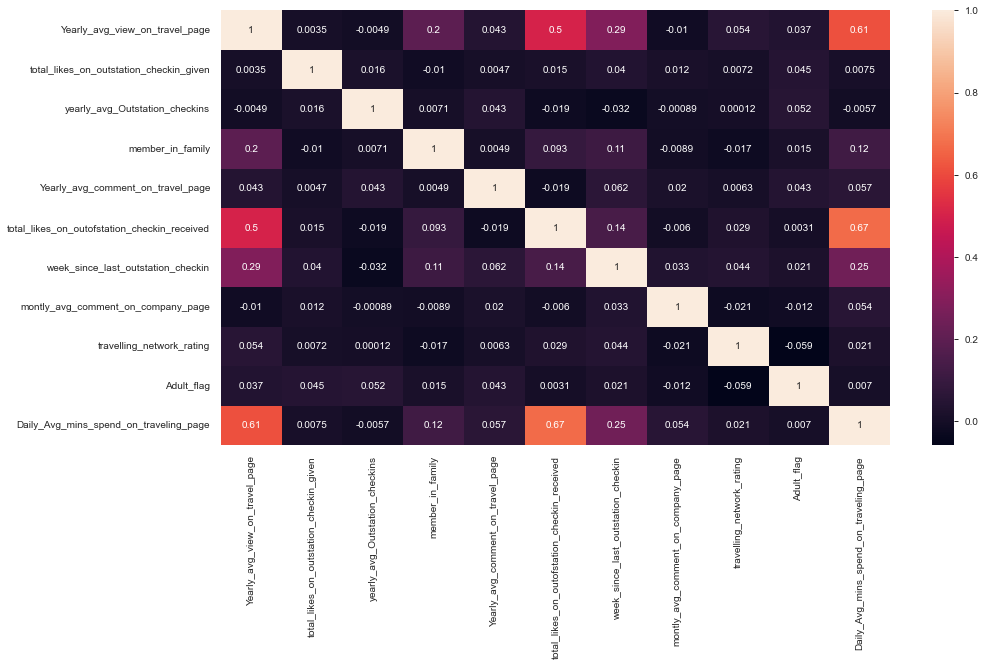

In [267]:
sns.heatmap(df_heart.corr(),annot=True)

In [269]:
df_heart_num=df_heart.select_dtypes(include="number")
df_heart_num.columns

Index(['Yearly_avg_view_on_travel_page',
       'total_likes_on_outstation_checkin_given',
       'yearly_avg_Outstation_checkins', 'member_in_family',
       'Yearly_avg_comment_on_travel_page',
       'total_likes_on_outofstation_checkin_received',
       'week_since_last_outstation_checkin',
       'montly_avg_comment_on_company_page', 'travelling_network_rating',
       'Adult_flag', 'Daily_Avg_mins_spend_on_traveling_page'],
      dtype='object')

In [270]:
# As we are builkding moidel on on mobile device so we need to drop the column preferred device
df_heart_cat.drop(["preferred_device"],axis=1,inplace=True)
df_heart_cat.columns

Index(['Taken_product', 'preferred_location_type', 'following_company_page',
       'working_flag'],
      dtype='object')

In [271]:
df_heart_cat.isnull().sum()

Taken_product                0
preferred_location_type     31
following_company_page     103
working_flag                 0
dtype: int64

In [272]:
df_heart_cat.head()

,Taken_product,preferred_location_type,following_company_page,working_flag
0,Yes,Financial,Yes,No
1,No,Financial,No,Yes
2,Yes,Other,Yes,No
3,No,Financial,Yes,No
4,No,Medical,No,No


In [273]:
# out of 5 cat columns actuallyu 2 column are in numericalk sense like yearly avg outstation checkins and member in family
#so we convert the data type of those two columns

In [274]:
df_heart_num.isnull().sum()

Yearly_avg_view_on_travel_page                  581
total_likes_on_outstation_checkin_given         381
yearly_avg_Outstation_checkins                   76
member_in_family                                  0
Yearly_avg_comment_on_travel_page               206
total_likes_on_outofstation_checkin_received      0
week_since_last_outstation_checkin                0
montly_avg_comment_on_company_page                0
travelling_network_rating                         0
Adult_flag                                        0
Daily_Avg_mins_spend_on_traveling_page            0
dtype: int64

In [275]:
# handling the missing value of cat columns
df_heart_cat["preferred_location_type"]=df_heart_cat["preferred_location_type"].fillna(df_heart_cat["preferred_location_type"].mode()[0])

In [276]:
# handling the missing value of cat columns
df_heart_cat["following_company_page"]=df_heart_cat["following_company_page"].fillna(df_heart_cat["following_company_page"].mode()[0])

In [277]:
df_heart_cat.isnull().sum()

Taken_product              0
preferred_location_type    0
following_company_page     0
working_flag               0
dtype: int64

In [278]:
# so we have handeled the missing value for all cat column using mode

In [279]:
df_heart_num.isnull().sum()

Yearly_avg_view_on_travel_page                  581
total_likes_on_outstation_checkin_given         381
yearly_avg_Outstation_checkins                   76
member_in_family                                  0
Yearly_avg_comment_on_travel_page               206
total_likes_on_outofstation_checkin_received      0
week_since_last_outstation_checkin                0
montly_avg_comment_on_company_page                0
travelling_network_rating                         0
Adult_flag                                        0
Daily_Avg_mins_spend_on_traveling_page            0
dtype: int64

In [280]:
df_heart_num.fillna(df_heart_num.mean(),inplace=True)

In [281]:
df_heart_num.isnull().sum()

Yearly_avg_view_on_travel_page                  0
total_likes_on_outstation_checkin_given         0
yearly_avg_Outstation_checkins                  0
member_in_family                                0
Yearly_avg_comment_on_travel_page               0
total_likes_on_outofstation_checkin_received    0
week_since_last_outstation_checkin              0
montly_avg_comment_on_company_page              0
travelling_network_rating                       0
Adult_flag                                      0
Daily_Avg_mins_spend_on_traveling_page          0
dtype: int64

In [282]:
df_heart.apply(lambda x:len(x.unique()))

Taken_product                                      2
Yearly_avg_view_on_travel_page                   330
preferred_device                                  10
total_likes_on_outstation_checkin_given         7085
yearly_avg_Outstation_checkins                    30
member_in_family                                   6
preferred_location_type                           16
Yearly_avg_comment_on_travel_page                101
total_likes_on_outofstation_checkin_received    5848
week_since_last_outstation_checkin                12
following_company_page                             3
montly_avg_comment_on_company_page               160
working_flag                                       2
travelling_network_rating                          4
Adult_flag                                         4
Daily_Avg_mins_spend_on_traveling_page            52
dtype: int64

In [283]:
df_heart_num.describe().iloc[:,[0,3,7,8]]

,Yearly_avg_view_on_travel_page,member_in_family,montly_avg_comment_on_company_page,travelling_network_rating
count,10652.000000,10652.000000,10652.000000,10652.000000
mean,280.687817,2.924052,28.896921,2.705595
std,66.706843,1.044928,51.084242,1.080931
min,35.000000,1.000000,11.000000,1.000000
25%,232.000000,2.000000,17.000000,2.000000
50%,276.000000,3.000000,22.000000,3.000000
75%,321.000000,4.000000,27.000000,4.000000
max,464.000000,10.000000,500.000000,4.000000


In [284]:
df_heart_cat.describe()

,Taken_product,preferred_location_type,following_company_page,working_flag
count,10652,10652,10652,10652
unique,2,15,2,2
top,No,Financial,No,No
freq,9032,2440,7699,9028


In [285]:
from pandas_profiling import ProfileReport

In [83]:
profile = ProfileReport(df_heart_num, title="Pandas Profiling Report")

In [84]:
profile

Summarize dataset:   0%|          | 0/24 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [85]:
profile = ProfileReport(df_heart_cat, title="Pandas Profiling Report")

profile

Summarize dataset:   0%|          | 0/17 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [286]:
plt.rcParams['figure.figsize'] = [10,10]

array([[<AxesSubplot:title={'center':'Yearly_avg_view_on_travel_page'}>,
        <AxesSubplot:title={'center':'total_likes_on_outstation_checkin_given'}>,
        <AxesSubplot:title={'center':'yearly_avg_Outstation_checkins'}>],
       [<AxesSubplot:title={'center':'member_in_family'}>,
        <AxesSubplot:title={'center':'Yearly_avg_comment_on_travel_page'}>,
        <AxesSubplot:title={'center':'total_likes_on_outofstation_checkin_received'}>],
       [<AxesSubplot:title={'center':'week_since_last_outstation_checkin'}>,
        <AxesSubplot:title={'center':'montly_avg_comment_on_company_page'}>,
        <AxesSubplot:title={'center':'travelling_network_rating'}>],
       [<AxesSubplot:title={'center':'Adult_flag'}>,
        <AxesSubplot:title={'center':'Daily_Avg_mins_spend_on_traveling_page'}>,
        <AxesSubplot:>]], dtype=object)

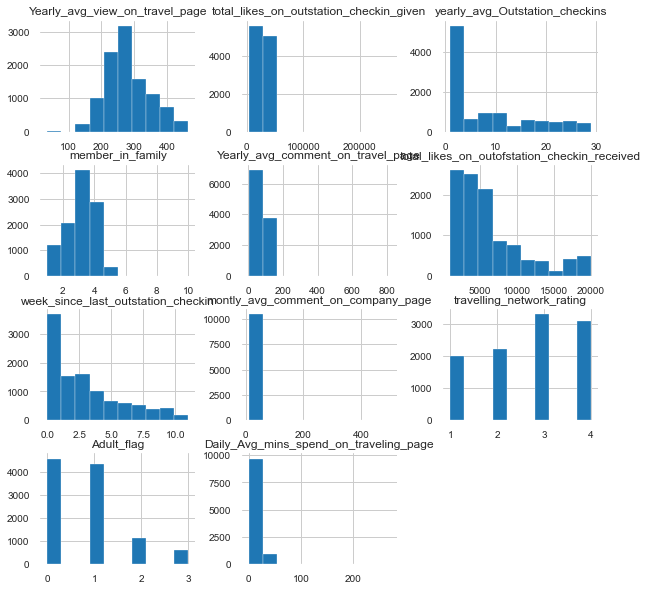

In [287]:
df_heart_num.hist()

In [288]:
cat_columns_list=df_heart_cat.columns.to_list()

In [289]:
plt.rcParams['figure.figsize'] = [10,5]

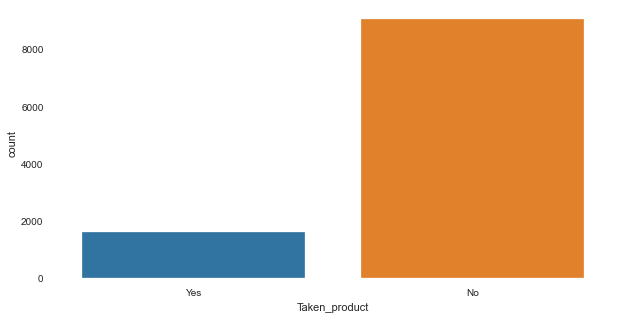

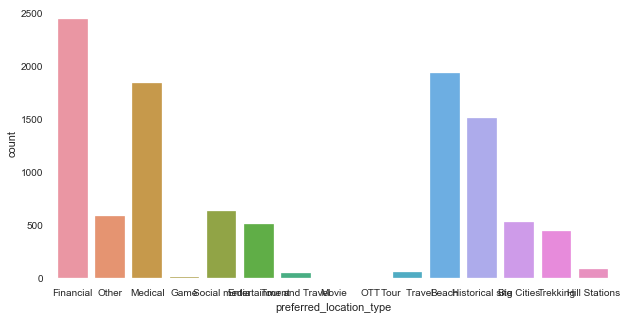

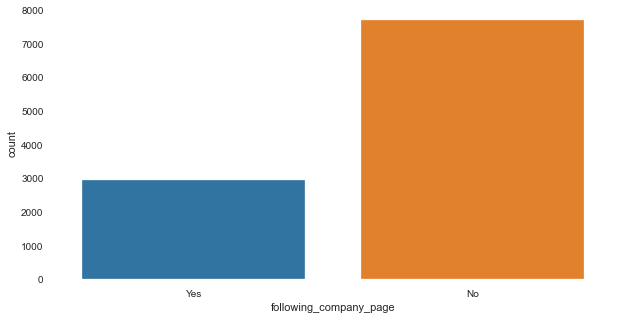

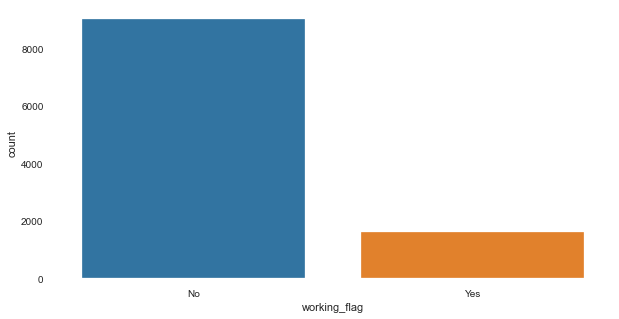

In [290]:
for i in df_heart_cat.columns:
    sns.countplot(df_heart_cat[i])
    plt.show()

<AxesSubplot:xlabel='Taken_product', ylabel='count'>

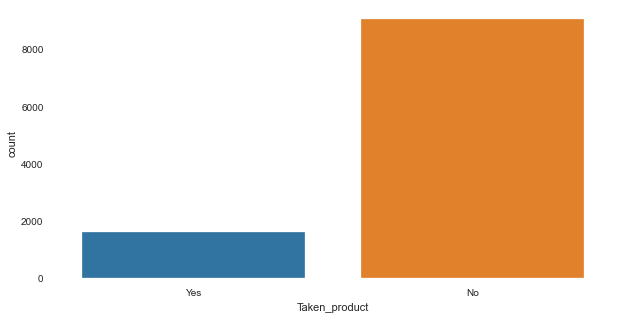

In [291]:
sns.countplot(df_heart_cat[cat_columns_list[0]])

<AxesSubplot:>

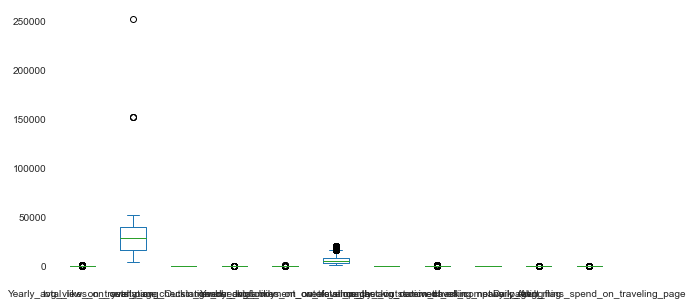

In [92]:
df_heart_num.plot(kind="box")

In [93]:
target_dis = df_heart_cat["Taken_product"].value_counts()
target_dis

No     9032
Yes    1620
Name: Taken_product, dtype: int64

In [94]:
target_perc = pd.Series((round(target_dis[0]/sum(target_dis),2), round(target_dis[1]/sum(target_dis),2)))
target_perc

0   0.850000
1   0.150000
dtype: float64

In [ ]:
df_main=pd.concat((features,target))

In [292]:
features.columns

Index(['Yearly_avg_view_on_travel_page',
       'total_likes_on_outstation_checkin_given',
       'yearly_avg_Outstation_checkins', 'member_in_family',
       'Yearly_avg_comment_on_travel_page',
       'total_likes_on_outofstation_checkin_received',
       'week_since_last_outstation_checkin',
       'montly_avg_comment_on_company_page', 'travelling_network_rating',
       'Adult_flag', 'Daily_Avg_mins_spend_on_traveling_page',
       'preferred_location_type_Beach', 'preferred_location_type_Big Cities',
       'preferred_location_type_Entertainment',
       'preferred_location_type_Financial', 'preferred_location_type_Game',
       'preferred_location_type_Hill Stations',
       'preferred_location_type_Historical site',
       'preferred_location_type_Medical', 'preferred_location_type_Movie',
       'preferred_location_type_OTT', 'preferred_location_type_Other',
       'preferred_location_type_Social media',
       'preferred_location_type_Tour  Travel',
       'preferred_location_

## Functions

In [95]:
def get_test_report(model, x_test, y_test):
    test_pred = model.predict(x_test)
    return(classification_report(y_test, test_pred))

In [96]:
def plot_confusion_matrix(model, x_test, y_test):
    y_pred = model.predict(x_test)
    cm = confusion_matrix(y_test, y_pred)
    conf_matrix = pd.DataFrame(data = cm,columns = ['Predicted:0','Predicted:1'], index = ['Actual:0','Actual:1'])
    sns.heatmap(conf_matrix, annot = True, fmt = 'd', cmap = ListedColormap(['lightskyblue']), cbar = False, 
                linewidths = 0.1, annot_kws = {'size':25})
    plt.xticks(fontsize = 20)
    plt.yticks(fontsize = 20)
    plt.show()

In [97]:
def plot_roc(model, x_test, y_test):
    y_pred_prob = model.predict_proba(x_test)[:,1]
    fpr, tpr, thresholds = roc_curve(y_test, y_pred_prob)
    plt.plot(fpr, tpr)
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.0])
    plt.plot([0, 1], [0, 1],'r--')
    plt.title('ROC curve', fontsize = 15)
    plt.xlabel('False positive rate (1-Specificity)', fontsize = 15)
    plt.ylabel('True positive rate (Sensitivity)', fontsize = 15)
    plt.text(x = 0.02, y = 0.9, s = ('AUC Score:',round(roc_auc_score(y_test, y_pred_prob),4)))
    plt.grid(True)

In [98]:
def calculate_auc_score(model, x_test, y_test):
    y_pred_prob = model.predict_proba(x_test)[:,1]
    return round(roc_auc_score(y_test, y_pred_prob),4)

In [99]:
models_summary = pd.DataFrame(columns=['Model_name', 'AUC_score', 'Accuracy', 'Precision', 'Recall', 'F1_score'])

In [100]:
def update_model_summary(model, x_test, y_test, model_name):
    y_predict = model.predict(x_test)
    return models_summary.append(pd.Series(
        {
            "Model_name": model_name,
            "AUC_score": calculate_auc_score(model, x_test, y_test),
            "Accuracy": model.score(x_test, y_test),
            "Precision": precision_score(y_test, y_predict),
            "Recall": recall_score(y_test, y_predict),
            "F1_score": f1_score(y_test, y_predict)
        }
    ), ignore_index=True)

## Spilt

In [293]:
target=df_heart_cat.iloc[:,[0]]
target.head()

,Taken_product
0,Yes
1,No
2,Yes
3,No
4,No


In [294]:
target.replace(to_replace="Yes",value=1,inplace=True)
target.replace(to_replace="No",value=0,inplace=True)

In [295]:
df_heart_cat=df_heart_cat.iloc[:,1:]

In [296]:
df_heart_cat.head()

,preferred_location_type,following_company_page,working_flag
0,Financial,Yes,No
1,Financial,No,Yes
2,Other,Yes,No
3,Financial,Yes,No
4,Medical,No,No


In [297]:
df_heart_cat_convert_num=pd.get_dummies(df_heart_cat)

In [298]:
df_features=pd.concat((df_heart_num,df_heart_cat_convert_num),axis=1)
df_features.shape

(10652, 30)

In [299]:
df_features.columns

Index(['Yearly_avg_view_on_travel_page',
       'total_likes_on_outstation_checkin_given',
       'yearly_avg_Outstation_checkins', 'member_in_family',
       'Yearly_avg_comment_on_travel_page',
       'total_likes_on_outofstation_checkin_received',
       'week_since_last_outstation_checkin',
       'montly_avg_comment_on_company_page', 'travelling_network_rating',
       'Adult_flag', 'Daily_Avg_mins_spend_on_traveling_page',
       'preferred_location_type_Beach', 'preferred_location_type_Big Cities',
       'preferred_location_type_Entertainment',
       'preferred_location_type_Financial', 'preferred_location_type_Game',
       'preferred_location_type_Hill Stations',
       'preferred_location_type_Historical site',
       'preferred_location_type_Medical', 'preferred_location_type_Movie',
       'preferred_location_type_OTT', 'preferred_location_type_Other',
       'preferred_location_type_Social media',
       'preferred_location_type_Tour  Travel',
       'preferred_location_

In [310]:
df_main=pd.concat((df_heart_num,target),axis=1)
main_columns_list=df_main.columns.to_list()

In [316]:
main_columns_list=main_columns_list[:-1]

In [304]:
df_main.head()

,Yearly_avg_view_on_travel_page,total_likes_on_outstation_checkin_given,yearly_avg_Outstation_checkins,member_in_family,Yearly_avg_comment_on_travel_page,total_likes_on_outofstation_checkin_received,week_since_last_outstation_checkin,montly_avg_comment_on_company_page,travelling_network_rating,Adult_flag,Daily_Avg_mins_spend_on_traveling_page,Taken_product
0,307.000000,38570.000000,1.000000,2.000000,94.000000,5993,8,11,1,0,8,1
1,367.000000,9765.000000,1.000000,1.000000,61.000000,5130,1,23,4,1,10,0
2,277.000000,48055.000000,1.000000,2.000000,92.000000,2090,6,15,2,0,7,1
3,247.000000,48720.000000,1.000000,4.000000,56.000000,2909,1,11,3,0,8,0
4,202.000000,20685.000000,1.000000,1.000000,40.000000,3468,9,12,4,1,6,0


<AxesSubplot:>

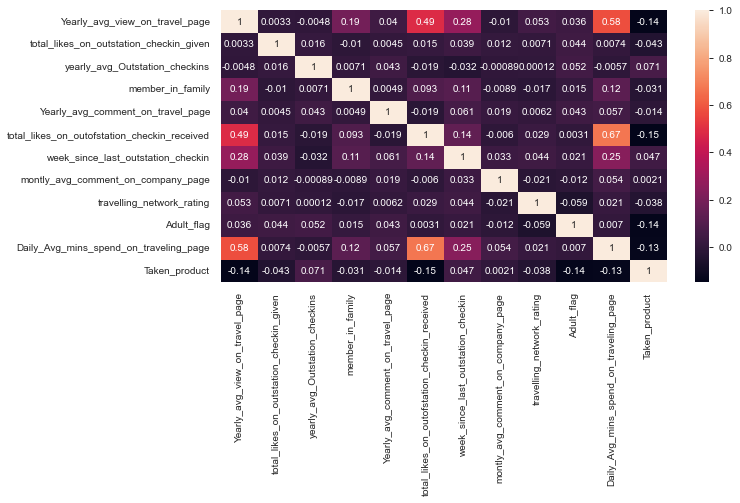

In [303]:
sns.heatmap(df_main.corr(),annot=True)

In [305]:
features=df_features.copy()

In [306]:
scaler = StandardScaler()
X_scaled = scaler.fit_transform(features)
X = pd.DataFrame(X_scaled, columns = features.columns)
X.head()

,Yearly_avg_view_on_travel_page,total_likes_on_outstation_checkin_given,yearly_avg_Outstation_checkins,member_in_family,Yearly_avg_comment_on_travel_page,total_likes_on_outofstation_checkin_received,week_since_last_outstation_checkin,montly_avg_comment_on_company_page,travelling_network_rating,Adult_flag,Daily_Avg_mins_spend_on_traveling_page,preferred_location_type_Beach,preferred_location_type_Big Cities,preferred_location_type_Entertainment,preferred_location_type_Financial,preferred_location_type_Game,preferred_location_type_Hill Stations,preferred_location_type_Historical site,preferred_location_type_Medical,preferred_location_type_Movie,preferred_location_type_OTT,preferred_location_type_Other,preferred_location_type_Social media,preferred_location_type_Tour Travel,preferred_location_type_Tour and Travel,preferred_location_type_Trekking,following_company_page_No,following_company_page_Yes,working_flag_No,working_flag_Yes
0,0.394464,0.727838,-0.821282,-0.884362,0.810084,-0.120364,1.817067,-0.350358,-1.577969,-0.932852,-0.637309,-0.470701,-0.228371,-0.225627,1.834550,-0.033583,-0.089154,-0.406727,-0.457703,-0.021671,-0.025643,-0.241497,-0.251356,-0.075264,-0.066572,-0.208555,-1.614676,1.614676,0.424128,-0.424128
1,1.293964,-1.296573,-0.821282,-1.841411,-0.561036,-0.302452,-0.846659,-0.115441,1.197547,0.237829,-0.418956,-0.470701,-0.228371,-0.225627,1.834550,-0.033583,-0.089154,-0.406727,-0.457703,-0.021671,-0.025643,-0.241497,-0.251356,-0.075264,-0.066572,-0.208555,0.619319,-0.619319,-2.357777,2.357777
2,-0.055287,1.394442,-0.821282,-0.884362,0.726986,-0.943873,1.056002,-0.272052,-0.652797,-0.932852,-0.746486,-0.470701,-0.228371,-0.225627,-0.545093,-0.033583,-0.089154,-0.406727,-0.457703,-0.021671,-0.025643,4.140834,-0.251356,-0.075264,-0.066572,-0.208555,-1.614676,1.614676,0.424128,-0.424128
3,-0.505037,1.441178,-0.821282,1.029735,-0.768782,-0.771069,-0.846659,-0.350358,0.272375,-0.932852,-0.637309,-0.470701,-0.228371,-0.225627,1.834550,-0.033583,-0.089154,-0.406727,-0.457703,-0.021671,-0.025643,-0.241497,-0.251356,-0.075264,-0.066572,-0.208555,-1.614676,1.614676,0.424128,-0.424128
4,-1.179662,-0.529117,-0.821282,-1.841411,-1.433567,-0.653123,2.197599,-0.330781,1.197547,0.237829,-0.855663,-0.470701,-0.228371,-0.225627,-0.545093,-0.033583,-0.089154,-0.406727,2.184821,-0.021671,-0.025643,-0.241497,-0.251356,-0.075264,-0.066572,-0.208555,0.619319,-0.619319,0.424128,-0.424128


In [317]:
X1=X[main_columns_list]
X1.columns

Index(['Yearly_avg_view_on_travel_page',
       'total_likes_on_outstation_checkin_given',
       'yearly_avg_Outstation_checkins', 'member_in_family',
       'Yearly_avg_comment_on_travel_page',
       'total_likes_on_outofstation_checkin_received',
       'week_since_last_outstation_checkin',
       'montly_avg_comment_on_company_page', 'travelling_network_rating',
       'Adult_flag', 'Daily_Avg_mins_spend_on_traveling_page'],
      dtype='object')

In [318]:
df_main=pd.concat((X1,target),axis=1)
df_main.columns

Index(['Yearly_avg_view_on_travel_page',
       'total_likes_on_outstation_checkin_given',
       'yearly_avg_Outstation_checkins', 'member_in_family',
       'Yearly_avg_comment_on_travel_page',
       'total_likes_on_outofstation_checkin_received',
       'week_since_last_outstation_checkin',
       'montly_avg_comment_on_company_page', 'travelling_network_rating',
       'Adult_flag', 'Daily_Avg_mins_spend_on_traveling_page',
       'Taken_product'],
      dtype='object')

<AxesSubplot:>

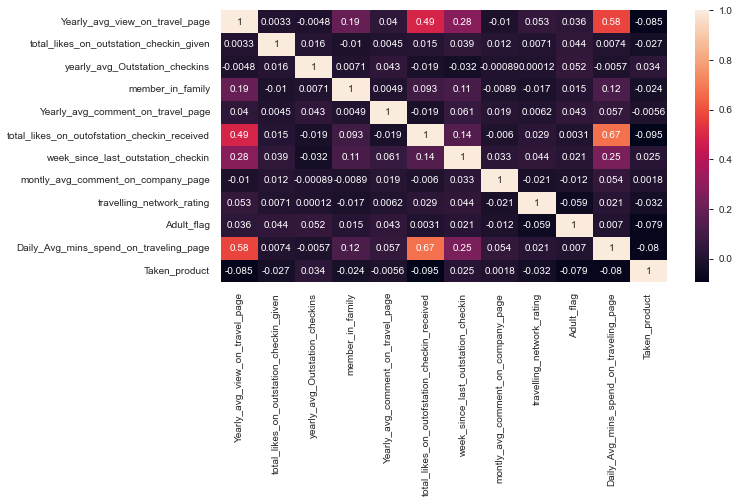

In [319]:
sns.heatmap(df_main.corr(),annot=True)

In [110]:
# scaler = MinMaxScaler()
# X_scaler = scaler.fit_transform(features)
# X = pd.DataFrame(X_scaled, columns = features.columns)
# X.head()

In [111]:
y = target

In [112]:
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.7, random_state=10)
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((7456, 30), (3196, 30), (7456, 1), (3196, 1))

# Models

## Logistic

In [113]:
lr = LogisticRegression()
logistic_model = lr.fit(X_train, y_train)

In [114]:
logistic_model.score(X_test, y_test)

0.8660826032540676

In [115]:
calculate_auc_score(logistic_model, X_test, y_test)

0.7807

In [116]:
test_report = get_test_report(logistic_model, X_test, y_test)
print(test_report)

              precision    recall  f1-score   support

           0       0.87      0.99      0.93      2708
           1       0.73      0.19      0.31       488

    accuracy                           0.87      3196
   macro avg       0.80      0.59      0.62      3196
weighted avg       0.85      0.87      0.83      3196



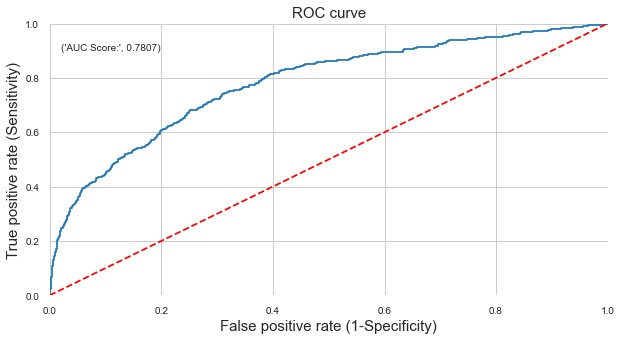

In [117]:
plot_roc(logistic_model, X_test, y_test)

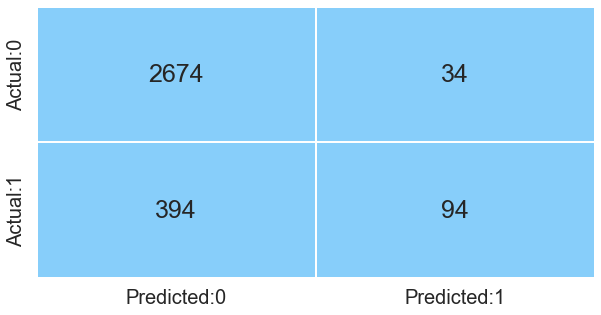

In [118]:
plot_confusion_matrix(logistic_model, X_test, y_test)

In [119]:
models_summary = update_model_summary(logistic_model, X_test, y_test, "Logistic model")

In [120]:
models_summary

,Model_name,AUC_score,Accuracy,Precision,Recall,F1_score
0,Logistic model,0.780700,0.866083,0.734375,0.192623,0.305195


## Naive Bayes

In [121]:
gnb = GaussianNB()
gnb_model = gnb.fit(X_train, y_train)

In [122]:
test_report = get_test_report(gnb_model, X_test, y_test)
print(test_report)

              precision    recall  f1-score   support

           0       0.87      0.95      0.91      2708
           1       0.40      0.20      0.26       488

    accuracy                           0.83      3196
   macro avg       0.63      0.57      0.58      3196
weighted avg       0.80      0.83      0.81      3196



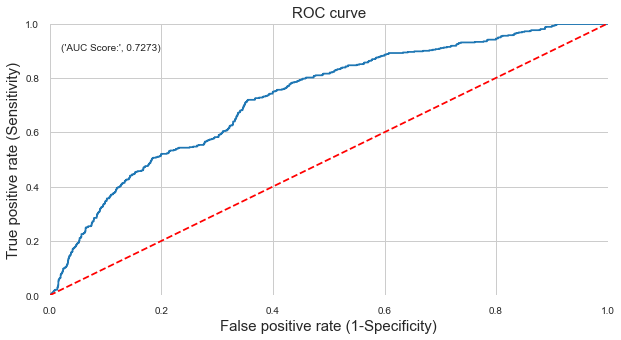

In [123]:
plot_roc(gnb_model, X_test, y_test)

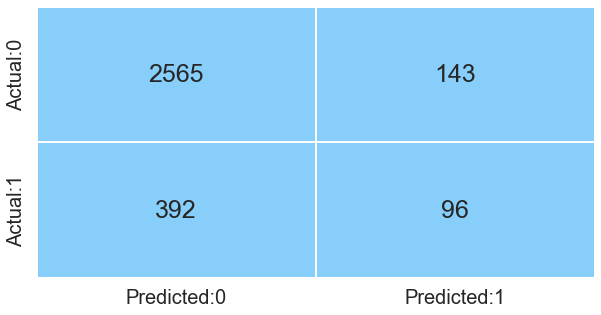

In [124]:
plot_confusion_matrix(gnb_model, X_test, y_test)

In [125]:
models_summary = update_model_summary(gnb_model, X_test, y_test, "GaussianNB model")

In [126]:
models_summary

,Model_name,AUC_score,Accuracy,Precision,Recall,F1_score
0,Logistic model,0.780700,0.866083,0.734375,0.192623,0.305195
1,GaussianNB model,0.727300,0.832603,0.401674,0.196721,0.264099


In [127]:
scores = cross_val_score(gnb_model, X, y, cv=10)
print("10 cross validationscore:\n",scores)
print("Average Score:", scores.mean())

10 cross validationscore:
 [0.80206379 0.82270169 0.79342723 0.17464789 0.7943662  0.80657277
 0.82253521 0.82159624 0.82629108 0.82910798]
Average Score: 0.7493310079362983


## KNN

In [128]:
knn_classification = KNeighborsClassifier(n_neighbors = 3)
knn_model = knn_classification.fit(X_train, y_train)

In [129]:
test_report = get_test_report(knn_model, X_test, y_test)
print(test_report)

              precision    recall  f1-score   support

           0       0.96      0.98      0.97      2708
           1       0.90      0.80      0.85       488

    accuracy                           0.96      3196
   macro avg       0.93      0.89      0.91      3196
weighted avg       0.96      0.96      0.96      3196



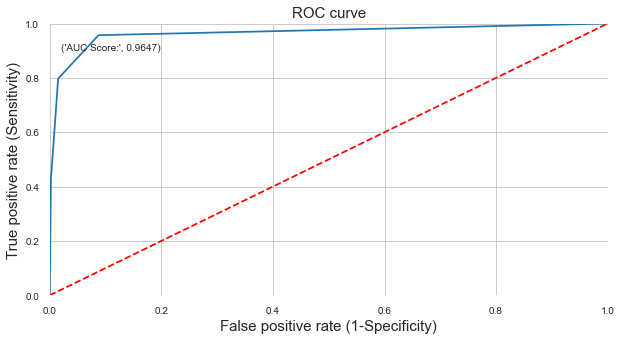

In [130]:
plot_roc(knn_model, X_test, y_test)

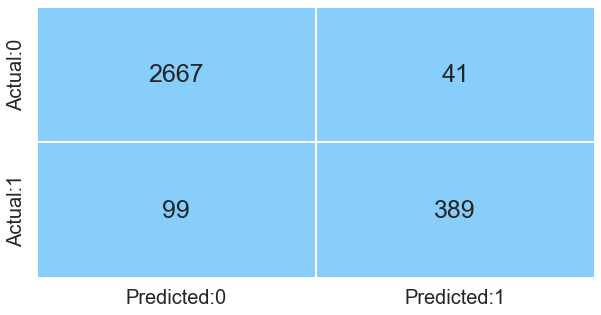

In [131]:
plot_confusion_matrix(knn_model, X_test, y_test)

In [132]:
models_summary = update_model_summary(knn_model, X_test, y_test, "KNN model")

In [133]:
models_summary

,Model_name,AUC_score,Accuracy,Precision,Recall,F1_score
0,Logistic model,0.780700,0.866083,0.734375,0.192623,0.305195
1,GaussianNB model,0.727300,0.832603,0.401674,0.196721,0.264099
2,KNN model,0.964700,0.956195,0.904651,0.797131,0.847495


### Finding best KNN

In [134]:
tuned_paramaters = {'n_neighbors': np.arange(1, 25, 2),
                   'metric': ['hamming','euclidean','manhattan','Chebyshev']}
 
# instantiate the 'KNeighborsClassifier' 
knn_classification = KNeighborsClassifier()

knn_grid = GridSearchCV(estimator = knn_classification, 
                        param_grid = tuned_paramaters, 
                        cv = 5, 
                        scoring = 'accuracy')

knn_grid.fit(X_train, y_train)

print('Best parameters for KNN Classifier: ', knn_grid.best_params_, '\n')

Best parameters for KNN Classifier:  {'metric': 'manhattan', 'n_neighbors': 1} 



In [135]:
best_knn_classification = KNeighborsClassifier(n_neighbors = 5, metric = 'manhattan')
best_knn_model = best_knn_classification.fit(X_train, y_train)

In [136]:
test_report = get_test_report(best_knn_model, X_test, y_test)
print(test_report)

              precision    recall  f1-score   support

           0       0.93      0.98      0.95      2708
           1       0.85      0.57      0.68       488

    accuracy                           0.92      3196
   macro avg       0.89      0.78      0.82      3196
weighted avg       0.91      0.92      0.91      3196



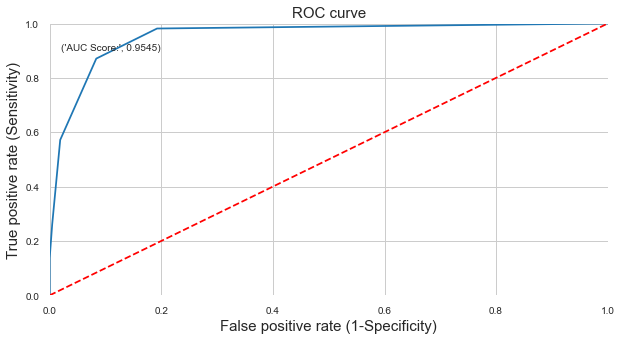

In [137]:
plot_roc(best_knn_model, X_test, y_test)

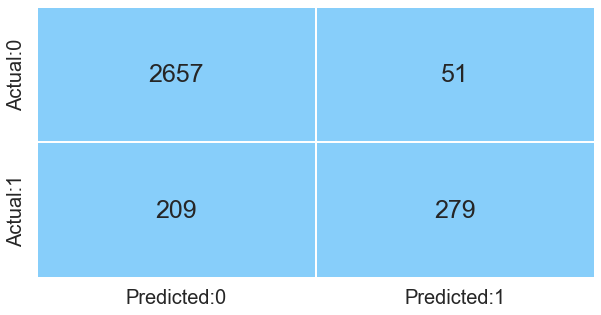

In [138]:
plot_confusion_matrix(best_knn_model, X_test, y_test)

In [139]:
models_summary = update_model_summary(best_knn_model, X_test, y_test, "KNN best model(manhattan - 5)")

In [140]:
models_summary

,Model_name,AUC_score,Accuracy,Precision,Recall,F1_score
0,Logistic model,0.780700,0.866083,0.734375,0.192623,0.305195
1,GaussianNB model,0.727300,0.832603,0.401674,0.196721,0.264099
2,KNN model,0.964700,0.956195,0.904651,0.797131,0.847495
3,KNN best model(manhattan - 5),0.954500,0.918648,0.845455,0.571721,0.682152


## Decision Tree

In [141]:
X_dec_train, X_dec_test, y_dec_train, y_dec_test = train_test_split(features, target, train_size=0.7, random_state=10)
X_dec_train.shape, X_dec_test.shape, y_dec_train.shape, y_dec_test.shape

((7456, 30), (3196, 30), (7456, 1), (3196, 1))

In [142]:
X_dec_train.head()

,Yearly_avg_view_on_travel_page,total_likes_on_outstation_checkin_given,yearly_avg_Outstation_checkins,member_in_family,Yearly_avg_comment_on_travel_page,total_likes_on_outofstation_checkin_received,week_since_last_outstation_checkin,montly_avg_comment_on_company_page,travelling_network_rating,Adult_flag,Daily_Avg_mins_spend_on_traveling_page,preferred_location_type_Beach,preferred_location_type_Big Cities,preferred_location_type_Entertainment,preferred_location_type_Financial,preferred_location_type_Game,preferred_location_type_Hill Stations,preferred_location_type_Historical site,preferred_location_type_Medical,preferred_location_type_Movie,preferred_location_type_OTT,preferred_location_type_Other,preferred_location_type_Social media,preferred_location_type_Tour Travel,preferred_location_type_Tour and Travel,preferred_location_type_Trekking,following_company_page_No,following_company_page_Yes,working_flag_No,working_flag_Yes
4963,302.000000,28213.720572,1.000000,10.000000,100.000000,2400,2,27,4,0,10,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,1
3339,233.000000,11548.000000,1.000000,2.000000,103.000000,2267,1,21,3,1,9,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0
927,270.000000,15015.000000,1.000000,4.000000,53.000000,5410,9,11,4,0,18,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0
5487,219.000000,7878.000000,1.000000,4.000000,114.000000,2405,8,23,3,0,15,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0
10712,150.000000,17173.000000,2.000000,2.000000,74.000000,2626,1,24,3,0,8,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,1,0


In [143]:
decision_tree_classification = DecisionTreeClassifier(criterion = 'entropy', random_state = 10)
decision_tree = decision_tree_classification.fit(X_dec_train, y_dec_train)

labels = X_train.columns
dot_data = tree.export_graphviz(decision_tree, feature_names = labels, class_names = ["0","1"])  
graph = pydotplus.graph_from_dot_data(dot_data)
Image(graph.create_png())

In [144]:
print(get_test_report(decision_tree, X_dec_test, y_dec_test))

              precision    recall  f1-score   support

           0       0.98      0.98      0.98      2708
           1       0.89      0.89      0.89       488

    accuracy                           0.97      3196
   macro avg       0.93      0.93      0.93      3196
weighted avg       0.97      0.97      0.97      3196



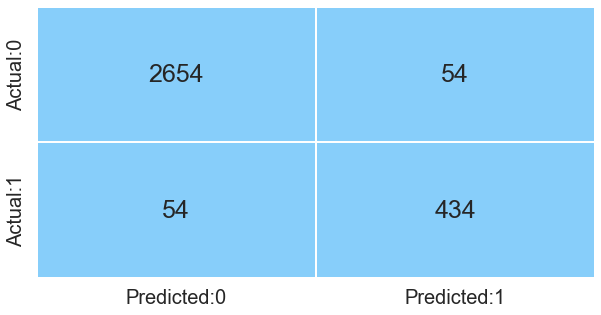

In [145]:
plot_confusion_matrix(decision_tree, X_dec_test, y_dec_test)

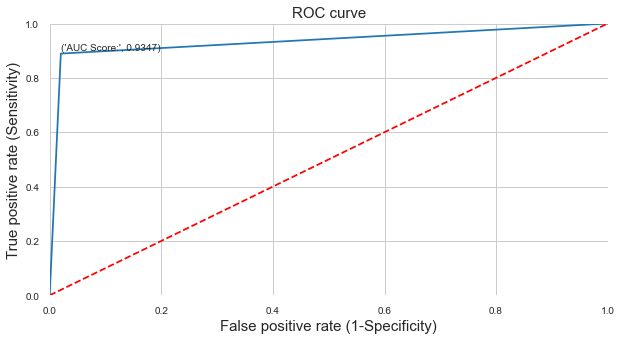

In [146]:
plot_roc(decision_tree, X_dec_test, y_dec_test)

In [147]:
models_summary = update_model_summary(decision_tree, X_dec_test, y_dec_test, "Decission Tree - Entropy")

In [148]:
models_summary

,Model_name,AUC_score,Accuracy,Precision,Recall,F1_score
0,Logistic model,0.780700,0.866083,0.734375,0.192623,0.305195
1,GaussianNB model,0.727300,0.832603,0.401674,0.196721,0.264099
2,KNN model,0.964700,0.956195,0.904651,0.797131,0.847495
3,KNN best model(manhattan - 5),0.954500,0.918648,0.845455,0.571721,0.682152
4,Decission Tree - Entropy,0.934700,0.966208,0.889344,0.889344,0.889344


In [149]:
decision_tree_classification = DecisionTreeClassifier(criterion = 'gini', random_state = 10)
decision_tree = decision_tree_classification.fit(X_dec_train, y_dec_train)

labels = X_dec_train.columns
dot_data = tree.export_graphviz(decision_tree, feature_names = labels, class_names = ["0","1"])  
graph = pydotplus.graph_from_dot_data(dot_data)
Image(graph.create_png())

In [150]:
print(get_test_report(decision_tree, X_dec_test, y_dec_test))

              precision    recall  f1-score   support

           0       0.98      0.99      0.98      2708
           1       0.92      0.89      0.90       488

    accuracy                           0.97      3196
   macro avg       0.95      0.94      0.94      3196
weighted avg       0.97      0.97      0.97      3196



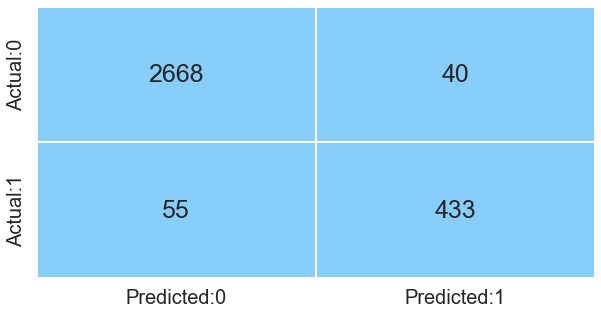

In [151]:
plot_confusion_matrix(decision_tree, X_dec_test, y_dec_test)

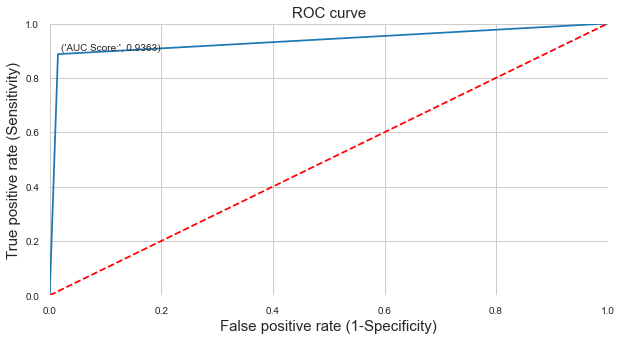

In [152]:
plot_roc(decision_tree, X_dec_test, y_dec_test)

In [153]:
models_summary = update_model_summary(decision_tree, X_dec_test, y_dec_test, "Decission Tree - Gini")

In [154]:
models_summary

,Model_name,AUC_score,Accuracy,Precision,Recall,F1_score
0,Logistic model,0.780700,0.866083,0.734375,0.192623,0.305195
1,GaussianNB model,0.727300,0.832603,0.401674,0.196721,0.264099
2,KNN model,0.964700,0.956195,0.904651,0.797131,0.847495
3,KNN best model(manhattan - 5),0.954500,0.918648,0.845455,0.571721,0.682152
4,Decission Tree - Entropy,0.934700,0.966208,0.889344,0.889344,0.889344
5,Decission Tree - Gini,0.936300,0.970275,0.915433,0.887295,0.901145


## Random Forest

In [155]:
rf_classification = RandomForestClassifier(n_estimators = 10, random_state = 10)
rf_model = rf_classification.fit(X_dec_train, y_dec_train)

In [156]:
print(get_test_report(rf_model, X_dec_test, y_dec_test))

              precision    recall  f1-score   support

           0       0.96      1.00      0.98      2708
           1       0.99      0.78      0.88       488

    accuracy                           0.97      3196
   macro avg       0.98      0.89      0.93      3196
weighted avg       0.97      0.97      0.96      3196



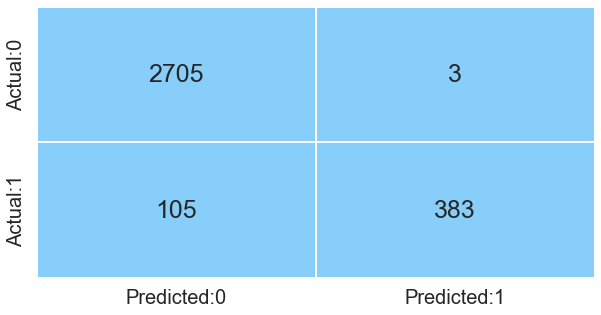

In [157]:
plot_confusion_matrix(rf_model, X_dec_test, y_dec_test)

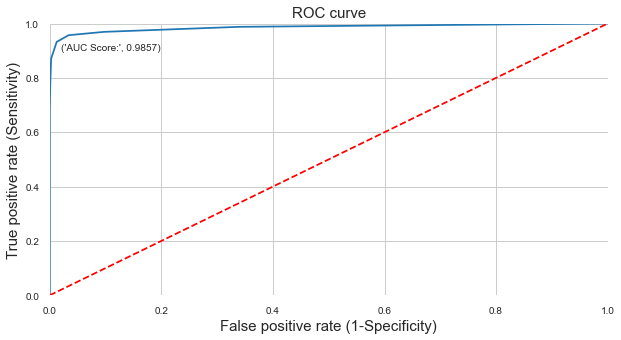

In [158]:
plot_roc(rf_model, X_dec_test, y_dec_test)

In [159]:
models_summary = update_model_summary(rf_model, X_dec_test, y_dec_test, "Random Forest")

In [160]:
models_summary

,Model_name,AUC_score,Accuracy,Precision,Recall,F1_score
0,Logistic model,0.780700,0.866083,0.734375,0.192623,0.305195
1,GaussianNB model,0.727300,0.832603,0.401674,0.196721,0.264099
2,KNN model,0.964700,0.956195,0.904651,0.797131,0.847495
3,KNN best model(manhattan - 5),0.954500,0.918648,0.845455,0.571721,0.682152
4,Decission Tree - Entropy,0.934700,0.966208,0.889344,0.889344,0.889344
5,Decission Tree - Gini,0.936300,0.970275,0.915433,0.887295,0.901145
6,Random Forest,0.985700,0.966208,0.992228,0.784836,0.876430


## Random Forest - Tuning Paramaters

In [161]:
'''%%time
tuned_paramaters = [{'criterion': ['entropy', 'gini'],
                     'n_estimators': [10, 30, 50, 70, 90],
                     'max_depth': [10, 15, 20],
                     'max_features': ['sqrt', 'log2'],
                     'min_samples_split': [2, 5, 8, 11],
                     'min_samples_leaf': [1, 5, 9],
                     'max_leaf_nodes': [2, 5, 8, 11]}]

random_forest_classification = RandomForestClassifier(random_state = 10)

rf_grid = GridSearchCV(estimator = random_forest_classification, 
                       param_grid = tuned_paramaters, 
                       cv = 5)

rf_grid_model = rf_grid.fit(X_dec_train, y_dec_train)

print('Best parameters for random forest classifier: ', rf_grid_model.best_params_, '\n')'''

"%%time\ntuned_paramaters = [{'criterion': ['entropy', 'gini'],\n                     'n_estimators': [10, 30, 50, 70, 90],\n                     'max_depth': [10, 15, 20],\n                     'max_features': ['sqrt', 'log2'],\n                     'min_samples_split': [2, 5, 8, 11],\n                     'min_samples_leaf': [1, 5, 9],\n                     'max_leaf_nodes': [2, 5, 8, 11]}]\n\nrandom_forest_classification = RandomForestClassifier(random_state = 10)\n\nrf_grid = GridSearchCV(estimator = random_forest_classification, \n                       param_grid = tuned_paramaters, \n                       cv = 5)\n\nrf_grid_model = rf_grid.fit(X_dec_train, y_dec_train)\n\nprint('Best parameters for random forest classifier: ', rf_grid_model.best_params_, '\n')"

In [162]:
'''%%time
tuned_paramaters = [{'criterion': ['entropy', 'gini'],
                     'n_estimators': [10, 30, 50, 70, 90],
                     'max_depth': [10, 15, 20],
                     'max_features': ['sqrt', 'log2'],
                     'min_samples_split': [2, 5, 8, 11],
                     'min_samples_leaf': [1, 5, 9],
                     'max_leaf_nodes': [2, 5, 8, 11]}]

random_forest_classification = RandomForestClassifier(random_state = 10)

rf_grid = GridSearchCV(estimator = random_forest_classification, 
                       param_grid = tuned_paramaters, 
                       cv = 5)

rf_grid_model = rf_grid.fit(X_dec_train, y_dec_train)

print('Best parameters for random forest classifier: ', rf_grid_model.best_params_, '\n')'''

"%%time\ntuned_paramaters = [{'criterion': ['entropy', 'gini'],\n                     'n_estimators': [10, 30, 50, 70, 90],\n                     'max_depth': [10, 15, 20],\n                     'max_features': ['sqrt', 'log2'],\n                     'min_samples_split': [2, 5, 8, 11],\n                     'min_samples_leaf': [1, 5, 9],\n                     'max_leaf_nodes': [2, 5, 8, 11]}]\n\nrandom_forest_classification = RandomForestClassifier(random_state = 10)\n\nrf_grid = GridSearchCV(estimator = random_forest_classification, \n                       param_grid = tuned_paramaters, \n                       cv = 5)\n\nrf_grid_model = rf_grid.fit(X_dec_train, y_dec_train)\n\nprint('Best parameters for random forest classifier: ', rf_grid_model.best_params_, '\n')"

In [163]:
'''Best parameters for random forest classifier:  {'criterion': 'entropy', 'max_depth': 10, 'max_features': 'sqrt', 'max_leaf_nodes': 5, 'min_samples_leaf': 5, 'min_samples_split': 11, 'n_estimators': 10} 

Wall time: 31min 20s'''

"Best parameters for random forest classifier:  {'criterion': 'entropy', 'max_depth': 10, 'max_features': 'sqrt', 'max_leaf_nodes': 5, 'min_samples_leaf': 5, 'min_samples_split': 11, 'n_estimators': 10} \n\nWall time: 31min 20s"

In [164]:
# rf_model_tune = RandomForestClassifier(criterion = rf_grid_model.best_params_.get('criterion'), 
#                                   n_estimators = rf_grid_model.best_params_.get('n_estimators'),
#                                   max_depth = rf_grid_model.best_params_.get('max_depth'),
#                                   max_features = rf_grid_model.best_params_.get('max_features'),
#                                   max_leaf_nodes = rf_grid_model.best_params_.get('max_leaf_nodes'),
#                                   min_samples_leaf = rf_grid_model.best_params_.get('min_samples_leaf'),
#                                   min_samples_split = rf_grid_model.best_params_.get('min_samples_split'),
#                                   random_state = 10)


rf_model_tune = RandomForestClassifier(criterion = 'entropy', 
                                  n_estimators = 10,
                                  max_depth = 10 ,
                                  max_features = 'sqrt',
                                  max_leaf_nodes = 5,
                                  min_samples_leaf = 5,
                                  min_samples_split = 11,
                                  random_state = 10)

rf_model_tune = rf_model_tune.fit(X_dec_train, y_dec_train)

# print the performance measures for test set for the model with best parameters
print('Classification Report for test set:\n', get_test_report(rf_model_tune, X_dec_test, y_dec_test))

Classification Report for test set:
               precision    recall  f1-score   support

           0       0.85      1.00      0.92      2708
           1       0.00      0.00      0.00       488

    accuracy                           0.85      3196
   macro avg       0.42      0.50      0.46      3196
weighted avg       0.72      0.85      0.78      3196



In [165]:
X_dec_train.columns

Index(['Yearly_avg_view_on_travel_page',
       'total_likes_on_outstation_checkin_given',
       'yearly_avg_Outstation_checkins', 'member_in_family',
       'Yearly_avg_comment_on_travel_page',
       'total_likes_on_outofstation_checkin_received',
       'week_since_last_outstation_checkin',
       'montly_avg_comment_on_company_page', 'travelling_network_rating',
       'Adult_flag', 'Daily_Avg_mins_spend_on_traveling_page',
       'preferred_location_type_Beach', 'preferred_location_type_Big Cities',
       'preferred_location_type_Entertainment',
       'preferred_location_type_Financial', 'preferred_location_type_Game',
       'preferred_location_type_Hill Stations',
       'preferred_location_type_Historical site',
       'preferred_location_type_Medical', 'preferred_location_type_Movie',
       'preferred_location_type_OTT', 'preferred_location_type_Other',
       'preferred_location_type_Social media',
       'preferred_location_type_Tour  Travel',
       'preferred_location_

In [166]:
X_dec_train.head()

,Yearly_avg_view_on_travel_page,total_likes_on_outstation_checkin_given,yearly_avg_Outstation_checkins,member_in_family,Yearly_avg_comment_on_travel_page,total_likes_on_outofstation_checkin_received,week_since_last_outstation_checkin,montly_avg_comment_on_company_page,travelling_network_rating,Adult_flag,Daily_Avg_mins_spend_on_traveling_page,preferred_location_type_Beach,preferred_location_type_Big Cities,preferred_location_type_Entertainment,preferred_location_type_Financial,preferred_location_type_Game,preferred_location_type_Hill Stations,preferred_location_type_Historical site,preferred_location_type_Medical,preferred_location_type_Movie,preferred_location_type_OTT,preferred_location_type_Other,preferred_location_type_Social media,preferred_location_type_Tour Travel,preferred_location_type_Tour and Travel,preferred_location_type_Trekking,following_company_page_No,following_company_page_Yes,working_flag_No,working_flag_Yes
4963,302.000000,28213.720572,1.000000,10.000000,100.000000,2400,2,27,4,0,10,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,1
3339,233.000000,11548.000000,1.000000,2.000000,103.000000,2267,1,21,3,1,9,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0
927,270.000000,15015.000000,1.000000,4.000000,53.000000,5410,9,11,4,0,18,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0
5487,219.000000,7878.000000,1.000000,4.000000,114.000000,2405,8,23,3,0,15,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0
10712,150.000000,17173.000000,2.000000,2.000000,74.000000,2626,1,24,3,0,8,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,1,0


In [167]:
print(get_test_report(rf_model_tune, X_dec_test, y_dec_test))

              precision    recall  f1-score   support

           0       0.85      1.00      0.92      2708
           1       0.00      0.00      0.00       488

    accuracy                           0.85      3196
   macro avg       0.42      0.50      0.46      3196
weighted avg       0.72      0.85      0.78      3196



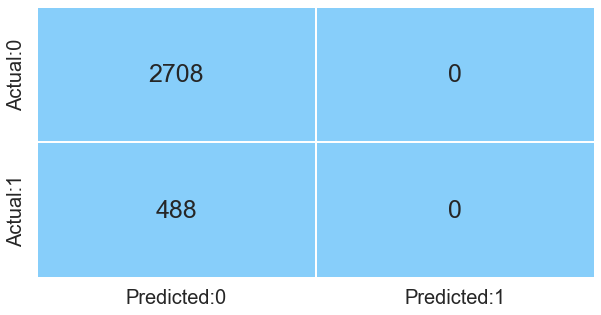

In [168]:
plot_confusion_matrix(rf_model_tune, X_dec_test, y_dec_test)

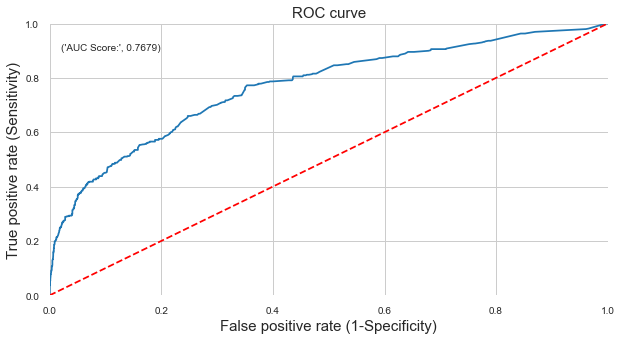

In [169]:
plot_roc(rf_model_tune, X_dec_test, y_dec_test)

In [170]:
models_summary = update_model_summary(rf_model_tune, X_dec_test, y_dec_test, "Random Forest - Tuned Hyperparameter")

In [171]:
models_summary

,Model_name,AUC_score,Accuracy,Precision,Recall,F1_score
0,Logistic model,0.780700,0.866083,0.734375,0.192623,0.305195
1,GaussianNB model,0.727300,0.832603,0.401674,0.196721,0.264099
2,KNN model,0.964700,0.956195,0.904651,0.797131,0.847495
3,KNN best model(manhattan - 5),0.954500,0.918648,0.845455,0.571721,0.682152
4,Decission Tree - Entropy,0.934700,0.966208,0.889344,0.889344,0.889344
5,Decission Tree - Gini,0.936300,0.970275,0.915433,0.887295,0.901145
6,Random Forest,0.985700,0.966208,0.992228,0.784836,0.876430
7,Random Forest - Tuned Hyperparameter,0.767900,0.847309,0.000000,0.000000,0.000000


In [172]:
base_model_summary = models_summary.copy()

In [173]:
base_model_summary.sort_values("AUC_score", ascending=False)

,Model_name,AUC_score,Accuracy,Precision,Recall,F1_score
6,Random Forest,0.985700,0.966208,0.992228,0.784836,0.876430
2,KNN model,0.964700,0.956195,0.904651,0.797131,0.847495
3,KNN best model(manhattan - 5),0.954500,0.918648,0.845455,0.571721,0.682152
5,Decission Tree - Gini,0.936300,0.970275,0.915433,0.887295,0.901145
4,Decission Tree - Entropy,0.934700,0.966208,0.889344,0.889344,0.889344
0,Logistic model,0.780700,0.866083,0.734375,0.192623,0.305195
7,Random Forest - Tuned Hyperparameter,0.767900,0.847309,0.000000,0.000000,0.000000
1,GaussianNB model,0.727300,0.832603,0.401674,0.196721,0.264099


# Improvization

## Logistic

## RFE

In [174]:
rfe_model = RFE(estimator=lr)
rfe_model = rfe_model.fit(X_train, y_train)
feat_index = pd.Series(data = rfe_model.ranking_, index = X_train.columns)
signi_feat_rfe = feat_index[feat_index==1].index
print(signi_feat_rfe)

Index(['Yearly_avg_view_on_travel_page',
       'total_likes_on_outstation_checkin_given',
       'yearly_avg_Outstation_checkins',
       'total_likes_on_outofstation_checkin_received',
       'week_since_last_outstation_checkin', 'travelling_network_rating',
       'Adult_flag', 'Daily_Avg_mins_spend_on_traveling_page',
       'preferred_location_type_Big Cities',
       'preferred_location_type_Entertainment',
       'preferred_location_type_Other', 'preferred_location_type_Social media',
       'preferred_location_type_Trekking', 'following_company_page_No',
       'following_company_page_Yes'],
      dtype='object')


In [175]:
X_rfe = X[signi_feat_rfe]
X_rfe.head()

,Yearly_avg_view_on_travel_page,total_likes_on_outstation_checkin_given,yearly_avg_Outstation_checkins,total_likes_on_outofstation_checkin_received,week_since_last_outstation_checkin,travelling_network_rating,Adult_flag,Daily_Avg_mins_spend_on_traveling_page,preferred_location_type_Big Cities,preferred_location_type_Entertainment,preferred_location_type_Other,preferred_location_type_Social media,preferred_location_type_Trekking,following_company_page_No,following_company_page_Yes
0,0.394464,0.727838,-0.821282,-0.120364,1.817067,-1.577969,-0.932852,-0.637309,-0.228371,-0.225627,-0.241497,-0.251356,-0.208555,-1.614676,1.614676
1,1.293964,-1.296573,-0.821282,-0.302452,-0.846659,1.197547,0.237829,-0.418956,-0.228371,-0.225627,-0.241497,-0.251356,-0.208555,0.619319,-0.619319
2,-0.055287,1.394442,-0.821282,-0.943873,1.056002,-0.652797,-0.932852,-0.746486,-0.228371,-0.225627,4.140834,-0.251356,-0.208555,-1.614676,1.614676
3,-0.505037,1.441178,-0.821282,-0.771069,-0.846659,0.272375,-0.932852,-0.637309,-0.228371,-0.225627,-0.241497,-0.251356,-0.208555,-1.614676,1.614676
4,-1.179662,-0.529117,-0.821282,-0.653123,2.197599,1.197547,0.237829,-0.855663,-0.228371,-0.225627,-0.241497,-0.251356,-0.208555,0.619319,-0.619319


In [176]:
X_rfe_train, X_rfe_test, y_rfe_train, y_rfe_test = train_test_split(X_rfe, y, test_size =   0.3, random_state = 0) 
X_rfe_train.shape, X_rfe_test.shape, y_rfe_train.shape, y_rfe_test.shape

((7456, 15), (3196, 15), (7456, 1), (3196, 1))

In [177]:
logistic_model_rfe = lr.fit(X_rfe_train, y_rfe_train)

In [178]:
test_report = get_test_report(logistic_model_rfe, X_rfe_test, y_rfe_test)
print(test_report)

              precision    recall  f1-score   support

           0       0.87      0.99      0.93      2712
           1       0.81      0.15      0.26       484

    accuracy                           0.87      3196
   macro avg       0.84      0.57      0.59      3196
weighted avg       0.86      0.87      0.83      3196



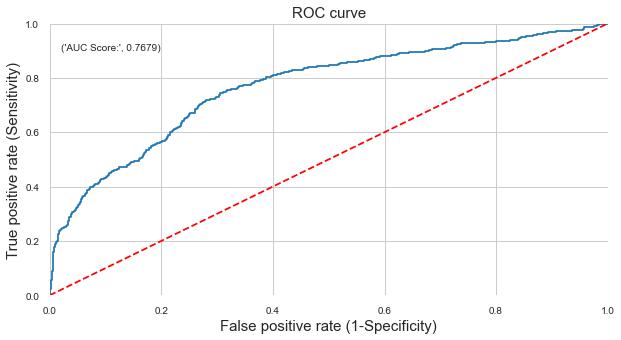

In [179]:
plot_roc(logistic_model_rfe, X_rfe_test, y_rfe_test)

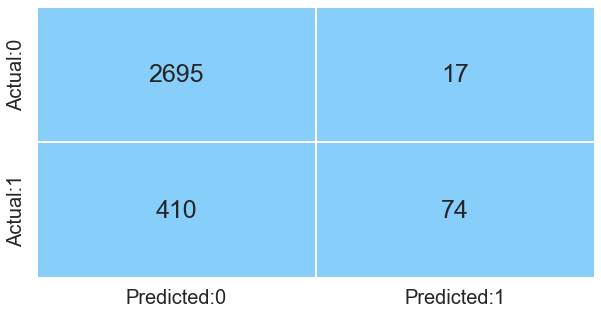

In [180]:
plot_confusion_matrix(logistic_model_rfe, X_rfe_test, y_rfe_test)

In [181]:
models_summary = update_model_summary(logistic_model_rfe, X_rfe_test, y_rfe_test, "Logistic Model from RFE")

In [182]:
models_summary

,Model_name,AUC_score,Accuracy,Precision,Recall,F1_score
0,Logistic model,0.780700,0.866083,0.734375,0.192623,0.305195
1,GaussianNB model,0.727300,0.832603,0.401674,0.196721,0.264099
2,KNN model,0.964700,0.956195,0.904651,0.797131,0.847495
3,KNN best model(manhattan - 5),0.954500,0.918648,0.845455,0.571721,0.682152
4,Decission Tree - Entropy,0.934700,0.966208,0.889344,0.889344,0.889344
5,Decission Tree - Gini,0.936300,0.970275,0.915433,0.887295,0.901145
6,Random Forest,0.985700,0.966208,0.992228,0.784836,0.876430
7,Random Forest - Tuned Hyperparameter,0.767900,0.847309,0.000000,0.000000,0.000000
8,Logistic Model from RFE,0.767900,0.866395,0.813187,0.152893,0.257391


## Forward Elimination

In [183]:
lr_forward = sfs(estimator = lr, k_features = 'best', forward = True)
sfs_forward = lr_forward.fit(X_train, y_train)

In [184]:
print('Features selelected using forward selection are: ')
sfs_forward_features = list(sfs_forward.k_feature_names_)
print(sfs_forward_features)
print('\nAccuracy: ', sfs_forward.k_score_)

Features selelected using forward selection are: 
['Yearly_avg_view_on_travel_page', 'yearly_avg_Outstation_checkins', 'total_likes_on_outofstation_checkin_received', 'montly_avg_comment_on_company_page', 'travelling_network_rating', 'Adult_flag', 'preferred_location_type_Beach', 'preferred_location_type_Big Cities', 'preferred_location_type_Game', 'preferred_location_type_Movie', 'preferred_location_type_OTT', 'preferred_location_type_Other', 'preferred_location_type_Social media', 'preferred_location_type_Trekking', 'following_company_page_No', 'following_company_page_Yes']

Accuracy:  0.8661474656698006


In [185]:
X_lr_fr = X[sfs_forward_features]
X_lr_fr.head()

,Yearly_avg_view_on_travel_page,yearly_avg_Outstation_checkins,total_likes_on_outofstation_checkin_received,montly_avg_comment_on_company_page,travelling_network_rating,Adult_flag,preferred_location_type_Beach,preferred_location_type_Big Cities,preferred_location_type_Game,preferred_location_type_Movie,preferred_location_type_OTT,preferred_location_type_Other,preferred_location_type_Social media,preferred_location_type_Trekking,following_company_page_No,following_company_page_Yes
0,0.394464,-0.821282,-0.120364,-0.350358,-1.577969,-0.932852,-0.470701,-0.228371,-0.033583,-0.021671,-0.025643,-0.241497,-0.251356,-0.208555,-1.614676,1.614676
1,1.293964,-0.821282,-0.302452,-0.115441,1.197547,0.237829,-0.470701,-0.228371,-0.033583,-0.021671,-0.025643,-0.241497,-0.251356,-0.208555,0.619319,-0.619319
2,-0.055287,-0.821282,-0.943873,-0.272052,-0.652797,-0.932852,-0.470701,-0.228371,-0.033583,-0.021671,-0.025643,4.140834,-0.251356,-0.208555,-1.614676,1.614676
3,-0.505037,-0.821282,-0.771069,-0.350358,0.272375,-0.932852,-0.470701,-0.228371,-0.033583,-0.021671,-0.025643,-0.241497,-0.251356,-0.208555,-1.614676,1.614676
4,-1.179662,-0.821282,-0.653123,-0.330781,1.197547,0.237829,-0.470701,-0.228371,-0.033583,-0.021671,-0.025643,-0.241497,-0.251356,-0.208555,0.619319,-0.619319


In [186]:
X_lr_fr_train, X_lr_fr_test, y_lr_fr_train, y_lr_fr_test = train_test_split(X_lr_fr, y, test_size =   0.3, random_state = 0) 
X_lr_fr_train.shape, X_lr_fr_test.shape, y_lr_fr_train.shape, y_lr_fr_test.shape

((7456, 16), (3196, 16), (7456, 1), (3196, 1))

In [187]:
logistic_model_lr_fr = lr.fit(X_lr_fr_train, y_lr_fr_train)

In [188]:
test_report = get_test_report(logistic_model_lr_fr, X_lr_fr_test, y_lr_fr_test)
print(test_report)

              precision    recall  f1-score   support

           0       0.87      0.99      0.93      2712
           1       0.81      0.14      0.24       484

    accuracy                           0.86      3196
   macro avg       0.84      0.57      0.58      3196
weighted avg       0.86      0.86      0.82      3196



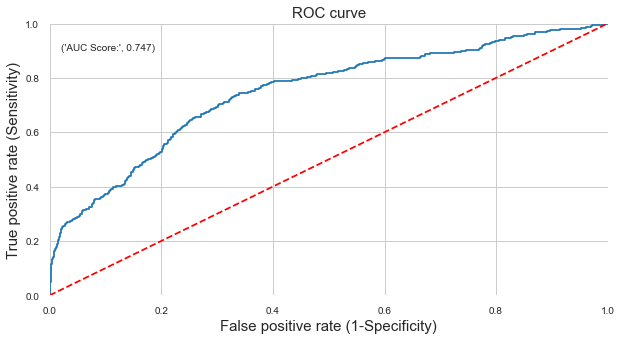

In [189]:
plot_roc(logistic_model_lr_fr, X_lr_fr_test, y_lr_fr_test)

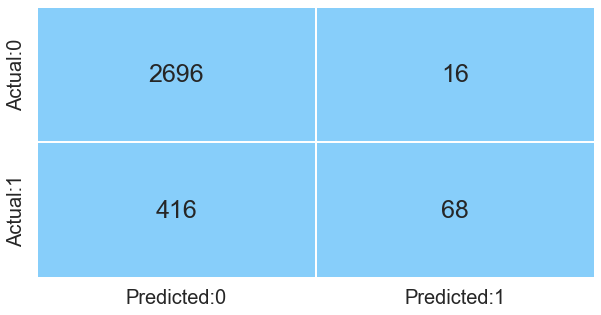

In [190]:
plot_confusion_matrix(logistic_model_lr_fr, X_lr_fr_test, y_lr_fr_test)

In [191]:
models_summary = update_model_summary(logistic_model_lr_fr, X_lr_fr_test, y_lr_fr_test, "Logistic Model from Forward Selection")

In [192]:
models_summary

,Model_name,AUC_score,Accuracy,Precision,Recall,F1_score
0,Logistic model,0.780700,0.866083,0.734375,0.192623,0.305195
1,GaussianNB model,0.727300,0.832603,0.401674,0.196721,0.264099
2,KNN model,0.964700,0.956195,0.904651,0.797131,0.847495
3,KNN best model(manhattan - 5),0.954500,0.918648,0.845455,0.571721,0.682152
4,Decission Tree - Entropy,0.934700,0.966208,0.889344,0.889344,0.889344
5,Decission Tree - Gini,0.936300,0.970275,0.915433,0.887295,0.901145
6,Random Forest,0.985700,0.966208,0.992228,0.784836,0.876430
7,Random Forest - Tuned Hyperparameter,0.767900,0.847309,0.000000,0.000000,0.000000
8,Logistic Model from RFE,0.767900,0.866395,0.813187,0.152893,0.257391
9,Logistic Model from Forward Selection,0.747000,0.864831,0.809524,0.140496,0.239437


## Backward Elimination

In [193]:
lr_backward = sfs(estimator = lr, k_features = 'best', forward = False)
sfs_backward = lr_backward.fit(X_train, y_train)

In [194]:
print('Features selelected using backward selection are: ')
sfs_backward_features = list(sfs_backward.k_feature_names_)
print(sfs_backward_features)
print('\nAccuracy: ', sfs_backward.k_score_)

Features selelected using backward selection are: 
['Yearly_avg_view_on_travel_page', 'total_likes_on_outstation_checkin_given', 'yearly_avg_Outstation_checkins', 'member_in_family', 'total_likes_on_outofstation_checkin_received', 'week_since_last_outstation_checkin', 'travelling_network_rating', 'Adult_flag', 'Daily_Avg_mins_spend_on_traveling_page', 'preferred_location_type_Beach', 'preferred_location_type_Big Cities', 'preferred_location_type_Hill Stations', 'preferred_location_type_Medical', 'preferred_location_type_Social media', 'preferred_location_type_Trekking', 'following_company_page_No']

Accuracy:  0.8682936762667156


In [195]:
X_lr_bk = X[sfs_backward_features]
X_lr_bk.head()

,Yearly_avg_view_on_travel_page,total_likes_on_outstation_checkin_given,yearly_avg_Outstation_checkins,member_in_family,total_likes_on_outofstation_checkin_received,week_since_last_outstation_checkin,travelling_network_rating,Adult_flag,Daily_Avg_mins_spend_on_traveling_page,preferred_location_type_Beach,preferred_location_type_Big Cities,preferred_location_type_Hill Stations,preferred_location_type_Medical,preferred_location_type_Social media,preferred_location_type_Trekking,following_company_page_No
0,0.394464,0.727838,-0.821282,-0.884362,-0.120364,1.817067,-1.577969,-0.932852,-0.637309,-0.470701,-0.228371,-0.089154,-0.457703,-0.251356,-0.208555,-1.614676
1,1.293964,-1.296573,-0.821282,-1.841411,-0.302452,-0.846659,1.197547,0.237829,-0.418956,-0.470701,-0.228371,-0.089154,-0.457703,-0.251356,-0.208555,0.619319
2,-0.055287,1.394442,-0.821282,-0.884362,-0.943873,1.056002,-0.652797,-0.932852,-0.746486,-0.470701,-0.228371,-0.089154,-0.457703,-0.251356,-0.208555,-1.614676
3,-0.505037,1.441178,-0.821282,1.029735,-0.771069,-0.846659,0.272375,-0.932852,-0.637309,-0.470701,-0.228371,-0.089154,-0.457703,-0.251356,-0.208555,-1.614676
4,-1.179662,-0.529117,-0.821282,-1.841411,-0.653123,2.197599,1.197547,0.237829,-0.855663,-0.470701,-0.228371,-0.089154,2.184821,-0.251356,-0.208555,0.619319


In [196]:
X_lr_bk_train, X_lr_bk_test, y_lr_bk_train, y_lr_bk_test = train_test_split(X_lr_bk, y, test_size =   0.3, random_state = 0) 
X_lr_bk_train.shape, X_lr_bk_test.shape, y_lr_bk_train.shape, y_lr_bk_test.shape

((7456, 16), (3196, 16), (7456, 1), (3196, 1))

In [197]:
logistic_model_lr_bk = lr.fit(X_lr_bk_train, y_lr_bk_train)

In [198]:
test_report = get_test_report(logistic_model_lr_bk, X_lr_bk_test, y_lr_bk_test)
print(test_report)

              precision    recall  f1-score   support

           0       0.87      0.99      0.93      2712
           1       0.82      0.17      0.27       484

    accuracy                           0.87      3196
   macro avg       0.84      0.58      0.60      3196
weighted avg       0.86      0.87      0.83      3196



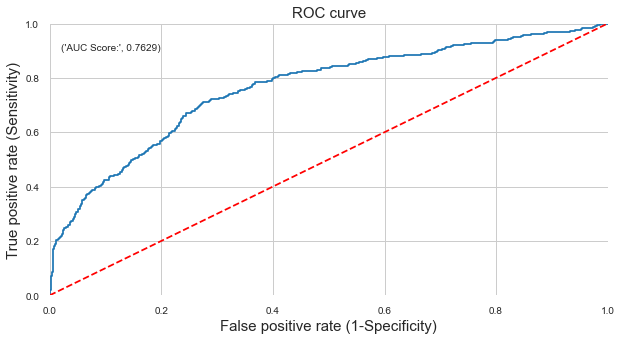

In [199]:
plot_roc(logistic_model_lr_bk, X_lr_bk_test, y_lr_bk_test)

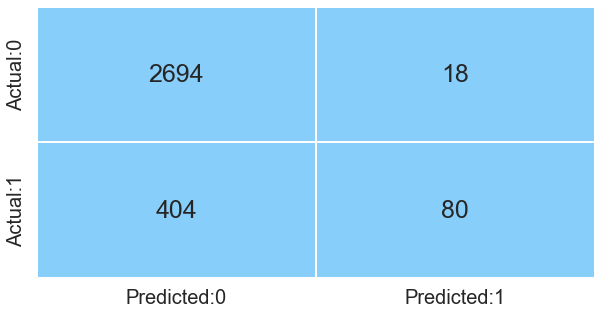

In [200]:
plot_confusion_matrix(logistic_model_lr_bk, X_lr_bk_test, y_lr_bk_test)

In [201]:
models_summary = update_model_summary(logistic_model_lr_bk, X_lr_bk_test, y_lr_bk_test, "Logistic Model from Backward Selection")

In [202]:
models_summary

,Model_name,AUC_score,Accuracy,Precision,Recall,F1_score
0,Logistic model,0.780700,0.866083,0.734375,0.192623,0.305195
1,GaussianNB model,0.727300,0.832603,0.401674,0.196721,0.264099
2,KNN model,0.964700,0.956195,0.904651,0.797131,0.847495
3,KNN best model(manhattan - 5),0.954500,0.918648,0.845455,0.571721,0.682152
4,Decission Tree - Entropy,0.934700,0.966208,0.889344,0.889344,0.889344
5,Decission Tree - Gini,0.936300,0.970275,0.915433,0.887295,0.901145
6,Random Forest,0.985700,0.966208,0.992228,0.784836,0.876430
7,Random Forest - Tuned Hyperparameter,0.767900,0.847309,0.000000,0.000000,0.000000
8,Logistic Model from RFE,0.767900,0.866395,0.813187,0.152893,0.257391
9,Logistic Model from Forward Selection,0.747000,0.864831,0.809524,0.140496,0.239437


In [203]:
models_summary.sort_values("AUC_score", ascending=False)

,Model_name,AUC_score,Accuracy,Precision,Recall,F1_score
6,Random Forest,0.985700,0.966208,0.992228,0.784836,0.876430
2,KNN model,0.964700,0.956195,0.904651,0.797131,0.847495
3,KNN best model(manhattan - 5),0.954500,0.918648,0.845455,0.571721,0.682152
5,Decission Tree - Gini,0.936300,0.970275,0.915433,0.887295,0.901145
4,Decission Tree - Entropy,0.934700,0.966208,0.889344,0.889344,0.889344
0,Logistic model,0.780700,0.866083,0.734375,0.192623,0.305195
7,Random Forest - Tuned Hyperparameter,0.767900,0.847309,0.000000,0.000000,0.000000
8,Logistic Model from RFE,0.767900,0.866395,0.813187,0.152893,0.257391
10,Logistic Model from Backward Selection,0.762900,0.867960,0.816327,0.165289,0.274914
9,Logistic Model from Forward Selection,0.747000,0.864831,0.809524,0.140496,0.239437


# SMOTE

In [206]:
from imblearn.over_sampling import SMOTE

In [205]:
!pip install imblearn

  Attempting uninstall: joblib
    Found existing installation: joblib 1.1.0
    Uninstalling joblib-1.1.0:
      Successfully uninstalled joblib-1.1.0


In [207]:
y.value_counts()

Taken_product
0                9032
1                1620
dtype: int64

In [209]:
sm = SMOTE(random_state=10)
X_sm, y_sm = sm.fit_resample(X, y)
y_sm.value_counts()

Taken_product
0                9032
1                9032
dtype: int64

In [210]:
X_sm_train, X_sm_test, y_sm_train, y_sm_test = train_test_split(X_sm, y_sm, test_size =   0.3, random_state = 0) 
X_sm_train.shape, X_sm_test.shape, y_sm_train.shape, y_sm_test.shape

((12644, 30), (5420, 30), (12644, 1), (5420, 1))

In [211]:
logistic_model_sm = lr.fit(X_sm_train, y_sm_train)

In [212]:
logistic_model_sm.score(X_sm_test, y_sm_test)

0.7059040590405904

In [213]:
calculate_auc_score(logistic_model_sm, X_sm_test, y_sm_test)

0.7797

In [214]:
test_report = get_test_report(logistic_model_sm, X_sm_test, y_sm_test)
print(test_report)

              precision    recall  f1-score   support

           0       0.70      0.70      0.70      2675
           1       0.71      0.71      0.71      2745

    accuracy                           0.71      5420
   macro avg       0.71      0.71      0.71      5420
weighted avg       0.71      0.71      0.71      5420



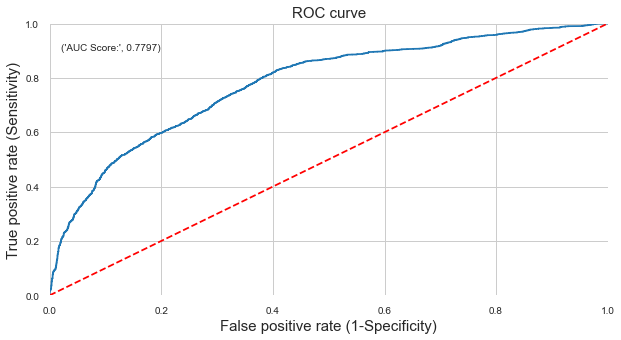

In [215]:
plot_roc(logistic_model_sm, X_sm_test, y_sm_test)

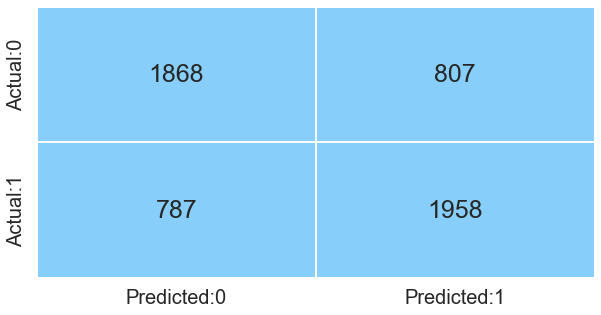

In [216]:
plot_confusion_matrix(logistic_model_sm, X_sm_test, y_sm_test)

In [217]:
models_summary = update_model_summary(logistic_model_sm, X_sm_test, y_sm_test, "Logistic Model after SMOTE")

In [218]:
models_summary

,Model_name,AUC_score,Accuracy,Precision,Recall,F1_score
0,Logistic model,0.780700,0.866083,0.734375,0.192623,0.305195
1,GaussianNB model,0.727300,0.832603,0.401674,0.196721,0.264099
2,KNN model,0.964700,0.956195,0.904651,0.797131,0.847495
3,KNN best model(manhattan - 5),0.954500,0.918648,0.845455,0.571721,0.682152
4,Decission Tree - Entropy,0.934700,0.966208,0.889344,0.889344,0.889344
5,Decission Tree - Gini,0.936300,0.970275,0.915433,0.887295,0.901145
6,Random Forest,0.985700,0.966208,0.992228,0.784836,0.876430
7,Random Forest - Tuned Hyperparameter,0.767900,0.847309,0.000000,0.000000,0.000000
8,Logistic Model from RFE,0.767900,0.866395,0.813187,0.152893,0.257391
9,Logistic Model from Forward Selection,0.747000,0.864831,0.809524,0.140496,0.239437


In [219]:
models_summary.sort_values("AUC_score", ascending=False)

,Model_name,AUC_score,Accuracy,Precision,Recall,F1_score
6,Random Forest,0.985700,0.966208,0.992228,0.784836,0.876430
2,KNN model,0.964700,0.956195,0.904651,0.797131,0.847495
3,KNN best model(manhattan - 5),0.954500,0.918648,0.845455,0.571721,0.682152
5,Decission Tree - Gini,0.936300,0.970275,0.915433,0.887295,0.901145
4,Decission Tree - Entropy,0.934700,0.966208,0.889344,0.889344,0.889344
0,Logistic model,0.780700,0.866083,0.734375,0.192623,0.305195
11,Logistic Model after SMOTE,0.779700,0.705904,0.708137,0.713297,0.710708
7,Random Forest - Tuned Hyperparameter,0.767900,0.847309,0.000000,0.000000,0.000000
8,Logistic Model from RFE,0.767900,0.866395,0.813187,0.152893,0.257391
10,Logistic Model from Backward Selection,0.762900,0.867960,0.816327,0.165289,0.274914


In [220]:
rf_model_tune = RandomForestClassifier(criterion = 'entropy', 
                                  n_estimators = 10,
                                  max_depth = 10 ,
                                  max_features = 'sqrt',
                                  max_leaf_nodes = 5,
                                  min_samples_leaf = 5,
                                  min_samples_split = 11,
                                  random_state = 10)

rf_model_tune = rf_model_tune.fit(X_dec_train, y_dec_train)

# print the performance measures for test set for the model with best parameters
print('Classification Report for test set:\n', get_test_report(rf_model_tune, X_dec_test, y_dec_test))

Classification Report for test set:
               precision    recall  f1-score   support

           0       0.85      1.00      0.92      2708
           1       0.00      0.00      0.00       488

    accuracy                           0.85      3196
   macro avg       0.42      0.50      0.46      3196
weighted avg       0.72      0.85      0.78      3196



In [221]:
def calculate_auc_score(model, x_test, y_test):
    y_pred_prob = model.predict_proba(x_test)[:,1]
    return round(roc_auc_score(y_test, y_pred_prob),4)

In [222]:
 X_dec_test, y_dec_test

(       Yearly_avg_view_on_travel_page  \
 10363                      249.000000   
 7782                       259.000000   
 5592                       272.000000   
 11158                      220.000000   
 5114                       264.000000   
 11045                      344.000000   
 6970                       228.000000   
 7559                       349.000000   
 2994                       196.000000   
 4370                       287.000000   
 8036                       312.000000   
 1208                       255.000000   
 4167                       235.000000   
 5285                       331.000000   
 9116                       141.000000   
 5431                       189.000000   
 2728                       217.000000   
 10718                      363.000000   
 8973                       349.000000   
 8571                       346.000000   
 2178                       270.000000   
 4328                       241.000000   
 6230                       324.00

In [223]:
y1_pred_prob=rf_model_tune.predict_proba(X_dec_test)[:,1]
round(roc_auc_score(y_dec_test, y1_pred_prob),4)

0.7679

In [224]:

rf_model_tune.score(X_dec_test,y_dec_test)

0.8473091364205256

In [225]:
rf_model_tune.predict(X_dec_test)[:5]

array([0, 0, 0, 0, 0], dtype=int64)

In [226]:
X_dec_test.head()

,Yearly_avg_view_on_travel_page,total_likes_on_outstation_checkin_given,yearly_avg_Outstation_checkins,member_in_family,Yearly_avg_comment_on_travel_page,total_likes_on_outofstation_checkin_received,week_since_last_outstation_checkin,montly_avg_comment_on_company_page,travelling_network_rating,Adult_flag,Daily_Avg_mins_spend_on_traveling_page,preferred_location_type_Beach,preferred_location_type_Big Cities,preferred_location_type_Entertainment,preferred_location_type_Financial,preferred_location_type_Game,preferred_location_type_Hill Stations,preferred_location_type_Historical site,preferred_location_type_Medical,preferred_location_type_Movie,preferred_location_type_OTT,preferred_location_type_Other,preferred_location_type_Social media,preferred_location_type_Tour Travel,preferred_location_type_Tour and Travel,preferred_location_type_Trekking,following_company_page_No,following_company_page_Yes,working_flag_No,working_flag_Yes
10363,249.000000,19230.000000,1.000000,3.000000,85.000000,6276,1,28,2,2,13,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0
7782,259.000000,45611.000000,2.000000,4.000000,67.000000,2771,3,23,3,1,14,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0
5592,272.000000,31326.000000,1.000000,4.000000,47.000000,4430,1,18,3,0,10,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,1,0
11158,220.000000,41304.000000,19.000000,4.000000,93.000000,3253,3,30,3,3,10,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,1,0
5114,264.000000,30920.000000,1.000000,4.000000,99.000000,7876,6,23,2,1,22,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0


# Export model

              precision    recall  f1-score   support

           0       0.99      0.99      0.99      2675
           1       0.99      0.99      0.99      2745

    accuracy                           0.99      5420
   macro avg       0.99      0.99      0.99      5420
weighted avg       0.99      0.99      0.99      5420



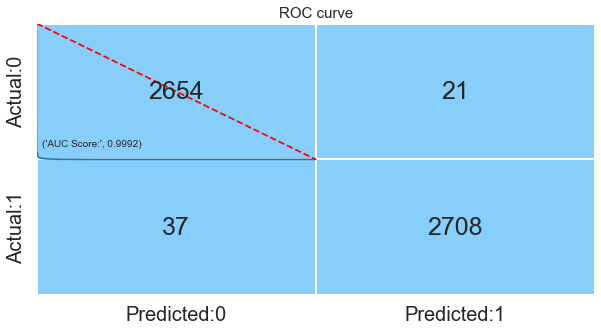

,Model_name,AUC_score,Accuracy,Precision,Recall,F1_score
0,Logistic model,0.780700,0.866083,0.734375,0.192623,0.305195
1,GaussianNB model,0.727300,0.832603,0.401674,0.196721,0.264099
2,KNN model,0.964700,0.956195,0.904651,0.797131,0.847495
3,KNN best model(manhattan - 5),0.954500,0.918648,0.845455,0.571721,0.682152
4,Decission Tree - Entropy,0.934700,0.966208,0.889344,0.889344,0.889344
5,Decission Tree - Gini,0.936300,0.970275,0.915433,0.887295,0.901145
6,Random Forest,0.985700,0.966208,0.992228,0.784836,0.876430
7,Random Forest - Tuned Hyperparameter,0.767900,0.847309,0.000000,0.000000,0.000000
8,Logistic Model from RFE,0.767900,0.866395,0.813187,0.152893,0.257391
9,Logistic Model from Forward Selection,0.747000,0.864831,0.809524,0.140496,0.239437


In [227]:
rf_sm = rf_classification.fit(X_sm_train, y_sm_train)
rf_sm.score(X_sm_test, y_sm_test)

calculate_auc_score(rf_sm, X_sm_test, y_sm_test)

test_report = get_test_report(rf_sm, X_sm_test, y_sm_test)
print(test_report)

plot_roc(rf_sm, X_sm_test, y_sm_test)

plot_confusion_matrix(rf_sm, X_sm_test, y_sm_test)

models_summary = update_model_summary(rf_sm, X_sm_test, y_sm_test, "Random Forest Model after SMOTE")

models_summary

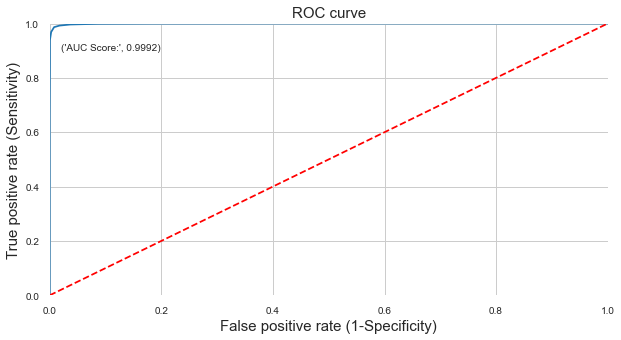

In [229]:
plot_roc(rf_sm, X_sm_test, y_sm_test)



In [236]:
# import 'Pandas' 
import pandas as pd 

# import 'Numpy' 
import numpy as np

# import subpackage of Matplotlib
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap

# import 'Seaborn' 
import seaborn as sns

# to suppress warnings
from warnings import filterwarnings
filterwarnings('ignore')

# display all columns of the dataframe
pd.options.display.max_columns = None

# display all rows of the dataframe
pd.options.display.max_rows = None
 
# to display the float values upto 6 decimal places     
pd.options.display.float_format = '{:.6f}'.format

# import train-test split 
from sklearn.model_selection import train_test_split

# import StandardScaler to perform scaling
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler

# import various functions from sklearn 
from sklearn.neighbors import KNeighborsClassifier
from sklearn import metrics
from sklearn.metrics import classification_report
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import cross_val_score
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn import tree
from sklearn.feature_selection import RFE
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import StackingClassifier

from mlxtend.feature_selection import SequentialFeatureSelector as sfs

# for performance metric
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score

# import the functions for visualizing the decision tree
import pydotplus
from IPython.display import Image

from xgboost import XGBClassifier

              precision    recall  f1-score   support

           0       0.79      0.79      0.79      2675
           1       0.79      0.79      0.79      2745

    accuracy                           0.79      5420
   macro avg       0.79      0.79      0.79      5420
weighted avg       0.79      0.79      0.79      5420



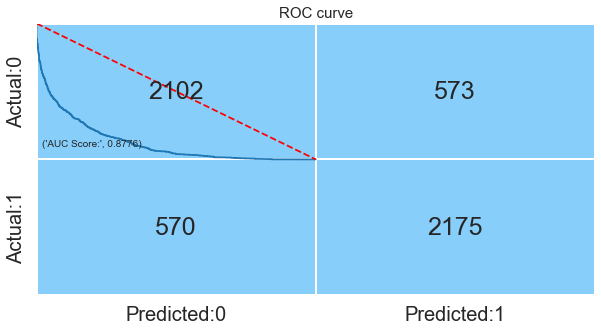

,Model_name,AUC_score,Accuracy,Precision,Recall,F1_score
0,Logistic model,0.780700,0.866083,0.734375,0.192623,0.305195
1,GaussianNB model,0.727300,0.832603,0.401674,0.196721,0.264099
2,KNN model,0.964700,0.956195,0.904651,0.797131,0.847495
3,KNN best model(manhattan - 5),0.954500,0.918648,0.845455,0.571721,0.682152
4,Decission Tree - Entropy,0.934700,0.966208,0.889344,0.889344,0.889344
5,Decission Tree - Gini,0.936300,0.970275,0.915433,0.887295,0.901145
6,Random Forest,0.985700,0.966208,0.992228,0.784836,0.876430
7,Random Forest - Tuned Hyperparameter,0.767900,0.847309,0.000000,0.000000,0.000000
8,Logistic Model from RFE,0.767900,0.866395,0.813187,0.152893,0.257391
9,Logistic Model from Forward Selection,0.747000,0.864831,0.809524,0.140496,0.239437


In [237]:
ada_model = AdaBoostClassifier(n_estimators = 40, random_state = 10)
rf_sm = ada_model.fit(X_sm_train, y_sm_train)
rf_sm.score(X_sm_test, y_sm_test)

calculate_auc_score(rf_sm, X_sm_test, y_sm_test)

test_report = get_test_report(rf_sm, X_sm_test, y_sm_test)
print(test_report)

plot_roc(rf_sm, X_sm_test, y_sm_test)

plot_confusion_matrix(rf_sm, X_sm_test, y_sm_test)

models_summary = update_model_summary(rf_sm, X_sm_test, y_sm_test, "AdaBoost Model after SMOTE")

models_summary

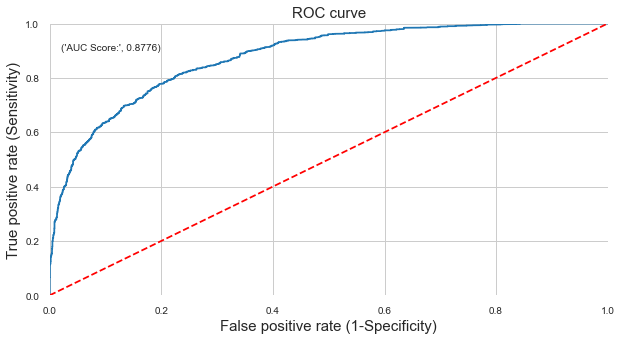

In [239]:

plot_roc(rf_sm, X_sm_test, y_sm_test)


In [243]:
models_summary.sort_values(by="AUC_score",ascending=False)

,Model_name,AUC_score,Accuracy,Precision,Recall,F1_score
12,Random Forest Model after SMOTE,0.999200,0.989299,0.992305,0.986521,0.989404
6,Random Forest,0.985700,0.966208,0.992228,0.784836,0.876430
2,KNN model,0.964700,0.956195,0.904651,0.797131,0.847495
3,KNN best model(manhattan - 5),0.954500,0.918648,0.845455,0.571721,0.682152
5,Decission Tree - Gini,0.936300,0.970275,0.915433,0.887295,0.901145
4,Decission Tree - Entropy,0.934700,0.966208,0.889344,0.889344,0.889344
13,AdaBoost Model after SMOTE,0.877600,0.789114,0.791485,0.792350,0.791917
0,Logistic model,0.780700,0.866083,0.734375,0.192623,0.305195
11,Logistic Model after SMOTE,0.779700,0.705904,0.708137,0.713297,0.710708
7,Random Forest - Tuned Hyperparameter,0.767900,0.847309,0.000000,0.000000,0.000000


In [230]:
import joblib

In [233]:
joblib.dump(rf_sm,'Tourism_prediction_model.ml')

['Tourism_prediction_model.ml']

In [234]:
import pickle
file=open('Toursim.pkl','wb')
pickle.dump(rf_sm,file)